# Sense change through collocations

## Module imports

Let's first import all the required packages.

In [1]:
# general
import os
import numpy as np
import pandas as pd
import time
import re
import itertools
import pickle

In [2]:
# clustering algorithms, distance metrics
from sklearn.cluster import DBSCAN,KMeans
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial import distance
import scipy.cluster.hierarchy as sch
# networks
import networkx as nx
from pyvis import network
from pyvis.network import Network

/home/krzys/Programy/anaconda3/envs/lvlt22/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# plotting
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [4]:
# corpus readers, coocurrences and word vectors
from nltk.collocations import *
import nltk
import pickle
#from cltk.stops import lat as lat_stops
#import cltk
from nltk.util import skipgrams
from nltk.lm import NgramCounter
from gensim.models import Word2Vec
from gensim.models.keyedvectors import Word2VecKeyedVectors
from gensim.similarities import MatrixSimilarity

from utils.data.buildCollocs import BuildCollocs
from utils.data.readCorpus import NltkCorpusFromDir, CorpusFromDir, NltkCorpusFromList
from utils.data.buildModels import BuildModels
from utils.data.collDiffs import collDiffs

If the `rebuild` parameter is set to `True` we will rerun the most resource-consuming code instead of reading the pre-computed variables from pickles.

In [5]:
rebuild = False

## Terms
We are interested in semantic change patterns of a set of terms related to the socio-political life, such as:

In [6]:
# define terms we're interested in
socio_political_terms = ["civitas", "consilium", "consul", "dux", "gens", "hostis", "imperator",
                         "jus", "labor", "natio", "nobilitas", "pontifex", "pontificium", "populus", "potestas", "regnum", "senatus", "sodes", "urbs"]
print(socio_political_terms)

['civitas', 'consilium', 'consul', 'dux', 'gens', 'hostis', 'imperator', 'jus', 'labor', 'natio', 'nobilitas', 'pontifex', 'pontificium', 'populus', 'potestas', 'regnum', 'senatus', 'sodes', 'urbs']


We're assigning each term a seperate colour to facilitate our analyses.

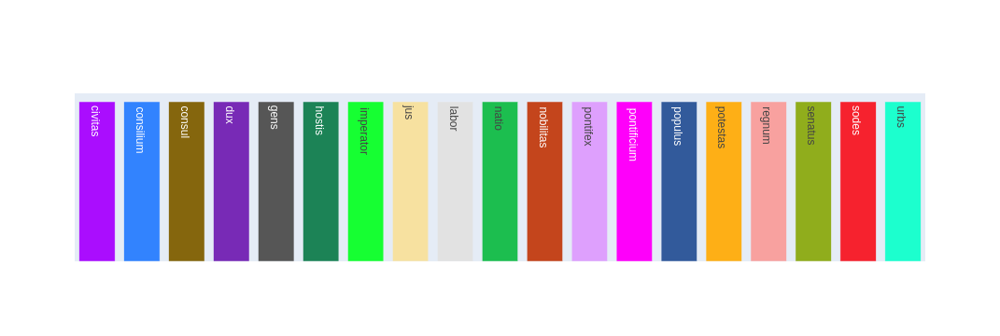

In [7]:
color_discrete_map_terms = { term : px.colors.qualitative.Alphabet[i] for i, term in enumerate(socio_political_terms)} # for each term we fix a color
fig = go.Figure()
fig.add_trace(go.Bar(
    x = [col for col in color_discrete_map_terms.keys()],
    y = [0.5 for x in range(0, len(color_discrete_map_terms)) ],
    text = socio_political_terms,
    textangle=90,
    marker_color=[col for col in color_discrete_map_terms.values()]
))
fig.update_layout(showlegend=False, xaxis={'showgrid': False, 'visible': False}, yaxis={'showgrid': False, 'visible': False})

## The corpus

The corpus processing phase follows as close as possible BMG's workflow to keep models compatible. There are 2 exceptions:

- all lemmas are converted to lowercase and
- anomalous lemmas (mostly punctuation) are added to stopword list.

In [8]:
# corpus files
dir_in = os.path.join("/home/krzys/Kod/streamlit/voces/data/corpora/latinise_IT_lemmas/")
files = os.listdir(os.path.join(dir_in))
files = [f for f in files[:] if "IT" in f]

#### Process the metadata
We'll be storing corpus metadata in a data frame.

In [9]:
# metadata
metadata_df = pd.read_csv(os.path.join(dir_in, 'latinise_metadata.csv'), sep = ",")
metadata_df = metadata_df[metadata_df['id'].str.startswith("IT")]
metadata_df.head()

,id,title,creator,date,type
18,IT-LAT0001,Vulgata,Hieronymus,382,poetry
19,IT-LAT0537,Ars amatoria,"Ovidius Naso, Publius",-9,poetry
20,IT-LAT0011,S. Benedicti Regula,Benedictus Nursianus,524,prose
21,IT-LAT0012,In psalmis Davidis expositio,Thomas Aquinas: Sanctus,1254,prose
22,IT-LAT0014,Adoro te devote,Thomas Aquinas: Sanctus,1254,poetry


In [10]:
first_date = min(metadata_df.date)
last_date = max(metadata_df.date)
print(first_date)
print(last_date)
size_interval = 500
n_intervals = round((last_date-first_date)/size_interval)
n_intervals
intervals = [None]*(n_intervals+1)
for t in range(n_intervals+1):
    #print(t)
    if t == 0:
        intervals[t] = first_date
    else:
        intervals[t] = intervals[t-1]+size_interval
    #print(intervals[t])
    
print(intervals)

-450
2005
[-450, 50, 550, 1050, 1550, 2050]


In [11]:
metadata_df['time_interval'] = ""
for t in range(len(intervals)-1):
    metadata_df_t = metadata_df.loc[metadata_df['date'].isin(range(intervals[t],intervals[t+1]))]
    metadata_df.loc[metadata_df['date'].isin(range(intervals[t],intervals[t+1])),'time_interval'] = intervals[t]
metadata_df

def convert_dates(sign, date0):

    if sign == "0":
        if date0 == 0:
            final_date = "+0000"
        elif date0 < 100:
            final_date = "+" + "00" + str(date0)
            #print("1-final_date", final_date)
        elif date0 < 1000:
            final_date = "+" + "0" + str(date0)
            #print("2-final_date", final_date)
        else:
            final_date = "+" + str(date0)
            #print("3-final_date", final_date)
    else:
        if date0 == 0:
            final_date = "+0000"
        elif date0 < 100:
            final_date = str(sign) + "00" + str(date0)
            #print("1-final_date", final_date)
        elif date0 < 1000:
            final_date = str(sign) + "0" + str(date0)
            #print("2-final_date", final_date)
        else:
            final_date = str(sign) + str(date0)
            #print("3-final_date", final_date)

    if final_date.startswith("+"):
        final_date = final_date.replace("+", "")
    return final_date

### Read in corpus files

In [12]:
# prepare the corpus
punctuation = ['.', ',', '...', ';', ':', '?', '(', ')', '-', '!', '[', ']', '"', "'", '""']

corpus = list()
files_corpus = metadata_df
for index, df_line in files_corpus.iterrows():
    #print("line:",df_line['id'], df_line['time_interval'])
    sign = "+"
    #print(df_line['date'])
    if df_line['date'] < 0:
        sign = "-"
    #print("date:", convert_dates(sign, abs(df_line['date'])))
    file_name = 'lat_'+str(convert_dates(sign, abs(df_line['date'])))+"_"+str(df_line['id'])+'.txt'
    #print("3:",file_name)
    #KN
    if os.path.isfile(os.path.join(dir_in, file_name)):
        file = open(os.path.join(dir_in, file_name), 'r')
        sentences_this_file = list()
        while True:
            line = file.readline().strip()
            if line != "":
                #sentences_this_file.append(line.split(" "))
                #sentences_this_file.append([token for token in line.split(" ") if token not in punctuation])
                corpus.append([token.lower() for token in line.split(" ") if token not in punctuation]) #KN: tolower
            # if line is empty end of file is reached
            if not line:
                break
        file.close()
        corpus.append(sentences_this_file)
    else:
        print(os.path.join(dir_in, file_name), " doesn't exist")

# KN: check for anomalous chars in the corpus
irregulars = set([ t for t in itertools.chain(*corpus) if re.match('\W',t) ])
print(irregulars) if len(irregulars) > 0 else print('no irregular chars')

no irregular chars


### Splitting the corpus
The corpus is splitted into slices, each covering 500 years.

In [13]:
# dictionary that maps a time interval with the list of sentences of texts in that time interval"
time2corpus = dict()

# I loop over all time intervals:
for t in range(n_intervals+1):
    files_corpus_t = metadata_df.loc[metadata_df['time_interval'] == intervals[t]]
    #print("1:",files_corpus_t, type(files_corpus_t))
    corpus_t = list()
    for index, df_line in files_corpus_t.iterrows():
        #print("line:",df_line['id'], df_line['time_interval'])
        sign = "+"
        #print(df_line['date'])
        if df_line['date'] < 0:
            sign = "-"
        #print("date:", convert_dates(sign, abs(df_line['date'])))
        file_name = 'lat_'+str(convert_dates(sign, abs(df_line['date'])))+"_"+str(df_line['id'])+'.txt'
        #print("3:",file_name)
        #KN: missing files
        if os.path.isfile(os.path.join(dir_in, file_name)):
            file = open(os.path.join(dir_in, file_name), 'r')
            sentences_this_file = list()
            while True:
                line = file.readline().strip()
                if line != "":
                    #sentences_this_file.append(line.split(" "))
                    #sentences_this_file.append([token for token in line.split(" ") if token not in punctuation])
                    corpus_t.append([token.lower() for token in line.split(" ") if token not in punctuation]) #KN: tolower
                # if line is empty end of file is reached
                if not line:
                    break
            file.close()
        #corpus_t.append(sentences_this_file)
    #corpus_t1
    #print(len(corpus_t1[0]))
    time2corpus[t] = corpus_t

The `time2corpus` variable is a dictionary with time slices as keys. Each item is a list of sentences, each being a list of lemmas.

In [14]:
print(f'Dictionary keys are: { [ period for period in time2corpus.keys()] }')
print('First 3 sentences from the 4th corpus slice are: ', time2corpus[4][0:2])

Dictionary keys are: [0, 1, 2, 3, 4, 5]
First 3 sentences from the 4th corpus slice are:  [['dominus', 'iesus', 'antequam', 'in', 'coelum', 'ascendo', 'suus', 'discipulus', 'mandatum', 'confero', 'nuntio', 'evangelium', 'cunctus', 'homo', 'omnesque', 'populus', 'baptizo', 'eo', 'in', 'mundum', 'universus', 'praedico#1', 'evangelium', 'omnis', 'creatura'], ['qui', 'credo', 'et', 'baptizo', 'sum', 'salvus', 'sum', 'quis#2', 'verus', 'non', 'credo', 'condemno', 'mc', 'data', 'sum', 'ego', 'omnis', 'potestas', 'in', 'caelum', 'et', 'in', 'terra']]


### Retrieve collocations

#### Build list of n-grams and compute association strengths 

We're going to use functions available in the `nltk` package. In order to do so, we first need (1) to convert corpora into the `nltk`-compatible format. Next, from each corpus, we are (2) retrieving lists of n-grams which (3) we feed to the so-called *finders* which count n-grams, filter out stopwords, and apply association strength measures to frequency counts.

In [15]:
if rebuild == True:
    # read the corpus into an NLTK-compatible format
    corpus_nltk = NltkCorpusFromList(corpus)
    print(f"This corpus contains {len(corpus_nltk.sents())} sentences and {len(corpus_nltk.words())} words.")

First, we're retrieving 50 collocations computed on non-contiguous 5-grams of each term **in the entire corpus**.

In [16]:
if rebuild == True:    
    collocs = list()
    for term in socio_political_terms:
        print(f"\nBuilding finder for the term: {term}")
        colls = BuildCollocs(corpus_nltk, term=term, window=5, filtering=True, top=50)
        colls.getFinder()
        print(f"Getting top 50 collocations for the term: {term}")
        tops = colls.getAllNtops()
        collocs.append((term, tops))
        
        # saving collocation sets for the next generations
        with open('collocations_all.pickle', 'wb') as f:
            pickle.dump(collocs,f)
          
elif rebuild == False:
    with open('collocations_all.pickle', 'rb') as f:
        collocs = pickle.load(f)

Let's inspect the data structure: each 2-tuple contains:
- the term itself and
- a list of 2-tuples: (association_measure, list_of_collocates).

In [17]:
print("a term ==> ", collocs[0][0],
      "\n", "a list of collocation tuples ==> ", collocs[0][1][0] )

a term ==>  civitas 
 a list of collocation tuples ==>  ('chi_sq', [('salernitanam', 'civitas'), ('civitas', 'velovocorum'), ('civitas', 'beneventanus'), ('adiectiones', 'civitas'), ('ceteraeve', 'civitas'), ('civitas', 'credendaque'), ('iazugum', 'civitas'), ('iungeremur', 'civitas'), ('lingonibus', 'civitas'), ('obstruxitque', 'civitas'), ('trapezuntem', 'civitas'), ('civitas', 'auctuque'), ('civitas', 'commilitium'), ('lingones', 'civitas'), ('in', 'civitas'), ('civitas', 'restaurasse'), ('alexandrina', 'civitas'), ('civitas', 'melfium'), ('civitas', 'trondemnis'), ('beneventanus', 'civitas'), ('civitas', 'barensem'), ('primoris', 'civitas'), ('alexandrinae', 'civitas'), ('civitas', 'temperavere'), ('peribant', 'civitas'), ('civitas', 'lingones'), ('platea', 'civitas'), ('civitas', 'exterminari'), ('civitas', 'feltrensi'), ('civitas', 'hrofi'), ('circumiectas', 'civitas'), ('civitas', 'abscessere'), ('profuturus', 'civitas'), ('civitas', 'london'), ('inmunitates', 'civitas'), ('pane

Now we'll retrieve collocations for every period of **the time-segmented corpus**.

In [18]:
if rebuild == True:
    # retrieve collocations for time slices
    collocs_time = list()
    for key, corp in time2corpus.items():
        # read the corpus into an NLTK-compatible format
        corp_nltk = NltkCorpusFromList(corp)
        print(f"\nBuilding for the corpus: {key}")
        print(f"This corpus contains {len(corp_nltk.sents())} sentences and {len(corp_nltk.words())} words.")
        for term in socio_political_terms:
            print(f"\nBuilding finder for the term: {term}")
            colls = BuildCollocs(corp_nltk, term=term, window=5, filtering=True, top=50)
            colls.getFinder()
            print(f"Getting top 50 collocations for the term: {term}")
            tops = colls.getAllNtops()
            collocs_time.append((key, term, tops))
        
        # saving collocation sets for the next generations
        with open('collocations_all_time.pickle', 'wb') as f:
            pickle.dump(collocs_time,f)

elif rebuild == False:
    with open('collocations_all_time.pickle', 'rb') as f:
        collocs_time = pickle.load(f)

The structure of the `collocs_time` is similar to `collocs`, as the list contains 3-tuples of (period, term, list_of_collocs):

`[ ( period_0, term_0, [(measure_0, [collocs_0])] ) ]`

In [19]:
print("period ==> ", collocs_time[0][0], "\n",
      "term ==> ", collocs_time[0][1], "\n",
      "a list of collocation tuples ==> ", collocs_time[0][2][0] )

period ==>  0 
 term ==>  civitas 
 a list of collocation tuples ==>  ('chi_sq', [('princeps', 'civitas'), ('civitas', 'dono'), ('primoris', 'civitas'), ('bergistanorum', 'civitas'), ('gaditana', 'civitas'), ('foederatus', 'civitas'), ('civitas', 'pergamena'), ('postliminium', 'civitas'), ('in', 'civitas'), ('civitas', 'universus'), ('liber', 'civitas'), ('absque', 'civitas'), ('abundaueras', 'civitas'), ('acragantina', 'civitas'), ('adseruari', 'civitas'), ('aesenti', 'civitas'), ('amantini', 'civitas'), ('avaritiaque', 'civitas'), ('aveniensem', 'civitas'), ('calventi', 'civitas'), ('ccicc', 'civitas'), ('certim', 'civitas'), ('civitas', 'admonitosque'), ('civitas', 'amicitae'), ('civitas', 'amque'), ('civitas', 'ancillaris'), ('civitas', 'annitebatur'), ('civitas', 'apelaurum'), ('civitas', 'auiolae'), ('civitas', 'caeritem'), ('civitas', 'calliphanam'), ('civitas', 'camertinum'), ('civitas', 'capenatiumque'), ('civitas', 'celeiates'), ('civitas', 'celtiberarum'), ('civitas', 'cerdi

#### Convert data for easy access
Let's now convert these data structures to dictionary for easier access.

In [20]:
# convert list of tuples into dict
collocs_dict = {}
for item in collocs:
    term = item[0]
    collocs_set = item[1]
    if collocs_dict.setdefault(term) is None:
        collocs_dict.setdefault(term)
        collocs_dict[term] = {}
    for coll in collocs_set:
        coeff = coll[0] # dice etc.
        colls = coll[1] # a list of collocs
        colls_only = [ list(filter(lambda w: w!=term, bigram)) for bigram in coll[1] ] # only collocates
        colls_only = [ x[0] if len(x) > 0 else term for x in colls_only ] # restores collocates which = term
        collocs_dict[term].setdefault(coeff, [])
        collocs_dict[term][coeff] = []
        collocs_dict[term][coeff].append(colls)
        collocs_dict[term][coeff].append(colls_only)

The collocations for each `term` and `association_measure` may be accessed as:
`collocs_dict[term][association_measure]`.
For example:

In [21]:
# inspect the dictionary
print(collocs_dict["civitas"]["dice"])

[[('princeps', 'civitas'), ('in', 'civitas'), ('idem', 'civitas'), ('porta', 'civitas'), ('apud', 'civitas'), ('universus', 'civitas'), ('civitas', 'romanus'), ('civitas', 'beneventanus'), ('totus#2', 'civitas'), ('de', 'civitas'), ('provincia', 'civitas'), ('murus', 'civitas'), ('civitas', 'ingredior'), ('per', 'civitas'), ('episcopus', 'civitas'), ('civitas', 'civis'), ('civitas', 'suus'), ('populus', 'civitas'), ('civitas', 'civitas'), ('autem', 'civitas'), ('ad', 'civitas'), ('civitas', 'populus'), ('quidam', 'civitas'), ('civitas', 'universus'), ('usque', 'civitas'), ('civitas', 'rex'), ('rex', 'civitas'), ('civitas', 'murus'), ('praedico', 'civitas'), ('beneventanus', 'civitas'), ('civitas', 'noster'), ('civitas', 'dono'), ('civitas', 'et'), ('noster', 'civitas'), ('civitas', 'provincia'), ('singulus', 'civitas'), ('civitas', 'porta'), ('graecia', 'civitas'), ('totus', 'civitas'), ('civitas', 'cum'), ('primoris', 'civitas'), ('civitas', 'episcopus'), ('civitas', 'quis#2'), ('nobi

## *Synchronic* collocations

Let's assume that the overlap between collocational sets of two or more words is indicative of their (dis)similarity. In this section, we are investigating synchronic collocation sets, that is collocations retrieved from the entire corpus. In the next sections, we'll be taking a closer look at diachronic overlap.

We choose for further analyses collocates retrieved with **Dice** coefficient as it usually yields the most interpretable results in manual corpus analysis (ie. content words, easy to understand syntagmatic and paradigmatic relation to node word).

In [22]:
labels = []
coll_sets = []
for coll_set in collocs_dict.items():
    labels.append(coll_set[0])
    coll_sets.append(coll_set[1]["dice"][1])
df = collDiffs.collDf(coll_sets, labels) #the df variable will be recycled
df.head()

,colloc,slice,rank
0,princeps,civitas,1
1,in,civitas,2
2,idem,civitas,3
3,porta,civitas,4
4,apud,civitas,5


### Collocational overlap and semantic similarity

Let's look which terms overlap the most and the least.

In [23]:
# plotting looong ranking tables
def showLongTable(dataframe, show=True, color=None, colormap = None):    
    dataframe.iteritems()
    rowcolors = None
    if color is not None and colormap is not None:
        rowcolors = [ colormap[i] for i in dataframe[color] ]
    tbl = go.Table(
        header=dict(values=list(dataframe.columns),
                    #fill_color='white',
                    align='center'),
        cells=dict(values= [data for (col, data) in dataframe.iteritems()],
                   fill_color=[rowcolors, "white", "white"],
                   line_color=[rowcolors] if colormap is not None else None,
                   align='center'))
    
    return go.Figure(data=[tbl]).show() if show==True else tbl

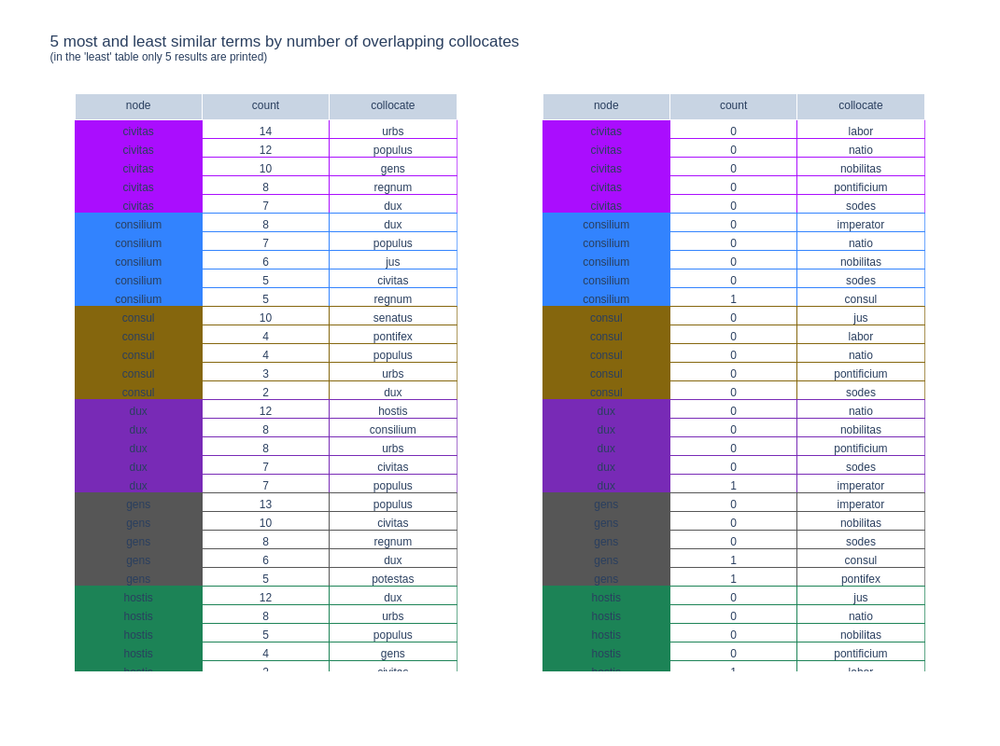

In [24]:
# most ...
fig1 = showLongTable(collDiffs.getNTop(df, top=5, ascending=False), show=False,
                     color="node", 
                     colormap=color_discrete_map_terms)
# ... and least similar by number of overlapping collocations
fig2 = showLongTable(collDiffs.getNTop(df, top=5, ascending=True), show=False,
                        color="node",
                     colormap=color_discrete_map_terms)

# plot both tables
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "table"},{"type": "table"}]])
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=1, col=2)
fig.update_layout(height=800,
                  title_text="5 most and least similar terms by number of overlapping collocates\
                  <br><sup>(in the 'least' table only 5 results are printed)</sup>"
                 )
fig.show()

In terms of collocational overlap count, the most similar pairs of terms in our set are:

In [25]:
# 10 most similar word pairs in the set (by colloc overlap)
sims_all = collDiffs.getNTop(df, top=-1, ascending=False).sort_values("count",ascending=False).drop_duplicates(
    subset=["node","collocate"])
sims_all[sims_all["node"] != sims_all["collocate"]]
dupes = sims_all.apply(frozenset,axis=1).duplicated()
sims = sims_all[~dupes]
sims.nlargest(10,"count")

,node,count,collocate
0,civitas,14,urbs
68,gens,13,populus
222,populus,12,civitas
85,hostis,12,dux
255,regnum,11,populus
34,consul,10,senatus
69,gens,10,civitas
224,populus,8,urbs
86,hostis,8,urbs
53,dux,8,urbs


The least similar pairs, on the other hand, are:

In [26]:
# 10 most dissimilar terms in the set (by colloc overlap)
sims.nsmallest(10,"count")

,node,count,collocate
291,sodes,0,civitas
292,sodes,0,consilium
287,senatus,0,pontificium
286,senatus,0,nobilitas
285,senatus,0,natio
284,senatus,0,labor
296,sodes,0,imperator
293,sodes,0,consul
288,senatus,0,regnum
301,sodes,0,pontifex


Let's inspect the collocational overlap of the entire set of terms (~ semantic similarity).

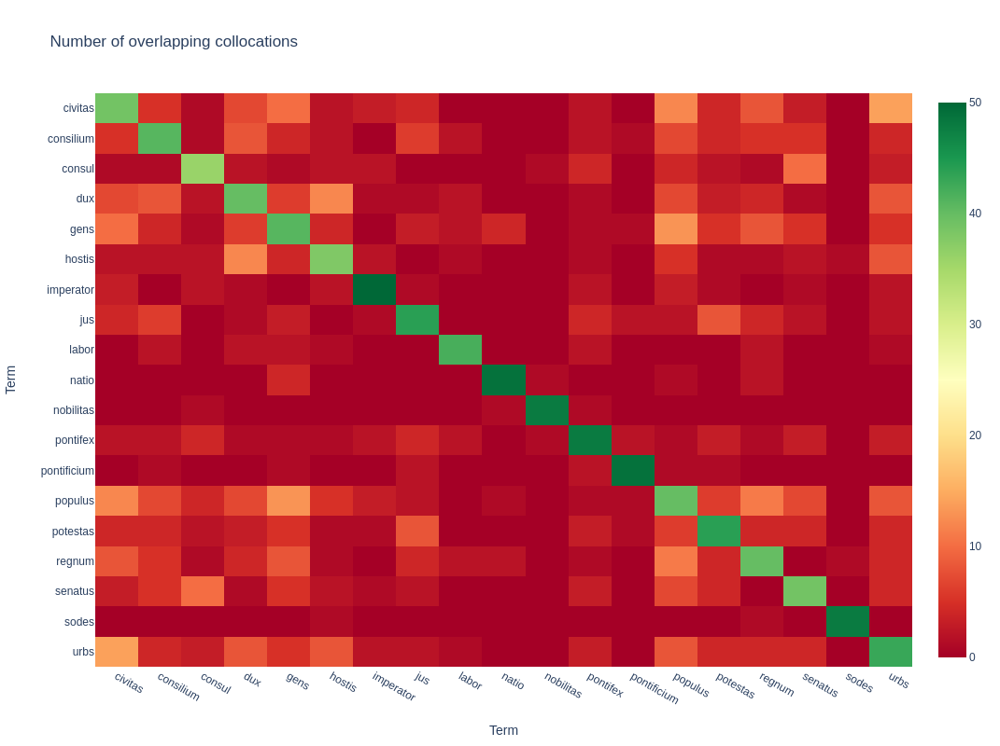

In [27]:
# plot similarity matrix
heatmap = collDiffs.plotCollDf(df, show=False)
heatmap.update_xaxes(title="Term").update_yaxes(title="Term")
heatmap.update_layout(height=800, 
                      title_text="Number of overlapping collocations")
heatmap.show()

In [28]:
# TODO: normalize counts
# TODO: overlaps by the collocate's rank
# TODO: limit display to count > 1

Distributional similarity *via* collocational overlap may be used to discover term clusters.

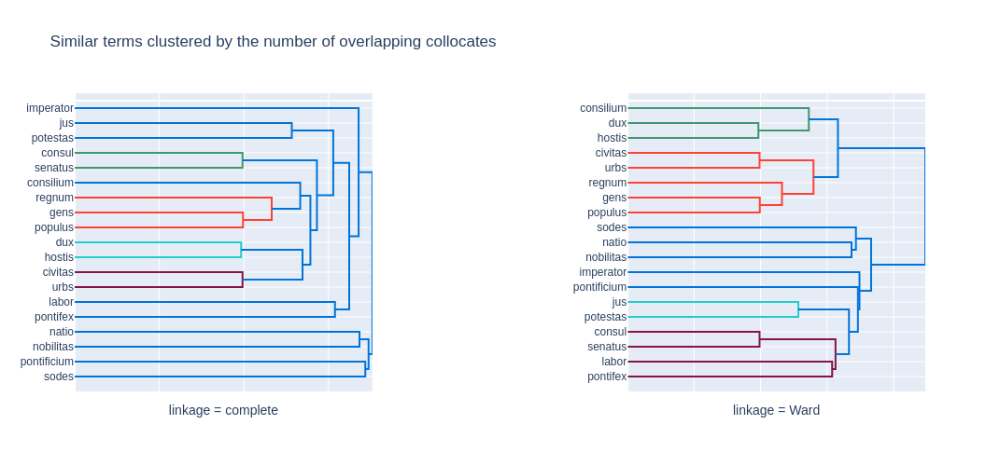

In [29]:
# default linkage method = complete
dendro1 = ff.create_dendrogram(collDiffs.all2all(coll_sets)[2], 
                              orientation='left', labels=labels)
# let's switch linkage method to Ward
dendro2 = ff.create_dendrogram(collDiffs.all2all(coll_sets)[2], 
                              orientation='left', labels=labels, linkagefun=lambda x: sch.linkage(x,'ward'))
fig = make_subplots(rows=1, cols=2, horizontal_spacing=0.3)

for data in dendro1['data']:
    fig.add_trace(data, row=1,col=1)
fig.update_xaxes(
    title_text="linkage = complete", row=1, col=1,ticktext=dendro1.layout.yaxis.ticktext,
    showticklabels=False)
fig.update_yaxes(row=1, col=1,ticktext=dendro1.layout.yaxis.ticktext, tickvals=dendro1.layout.yaxis.tickvals)

for data in dendro2['data']:
    fig.add_trace(data, row=1, col=2)
fig.update_xaxes(
    title_text="linkage = Ward", row=1, col=2,
    showticklabels=False)
fig.update_yaxes(row=1, col=2,ticktext=dendro2.layout.yaxis.ticktext, tickvals=dendro2.layout.yaxis.tickvals)


fig.update_layout(title="Similar terms clustered by the number of overlapping collocates",
                  showlegend=False, height=500, width=900)
fig.show()


Theoretically, each of the `socio_political_terms` can have `(len(socio_political_terms) -1) * ntop ` (where `ntop` is a number of top collocates taken into consideration) overlapping collocates. This fact may be used to gauge both the semantic coherence of the set as well as "prototypicality" of each of the terms or their semantic distance from other terms in the set.

Let's inspect *total overlap counts* for all terms in the set.

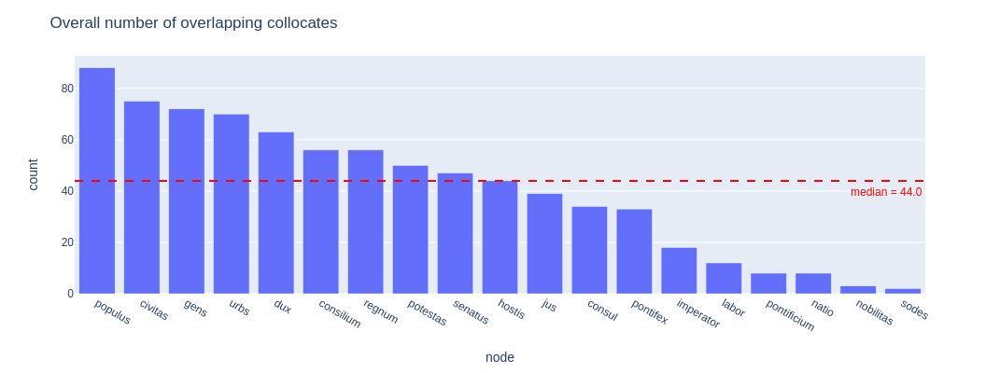

In [30]:
# terms by total number of overlapping collocates (~ set coherence)
sims_all_sum = sims_all[["node", "count"]].groupby("node").sum().reset_index().sort_values("count", ascending=False)
sims_med = sims_all_sum["count"].median()
fig = px.bar(sims_all_sum, x='node', y='count',
             #orientation="h",
             category_orders=[{"node":sims_all_sum["node"]}],
             color_discrete_map=color_discrete_map_terms)
fig.add_hline(y=sims_med, line_color="red", line_dash="dash",
              annotation_text="median = "+str(sims_med), 
              annotation_position="bottom right",annotation_font_color="red")
fig.update_layout(title="Overall number of overlapping collocates", height=400)
fig.show()

In [31]:
# TODO: check how it changes with ranks = [10, 20, ...]

## *Diachronic* collocations

Let's now turn to time-aware collocation counts.

### Data manipulation

As before, to make data manipulation easier, we'll start with converting collocation lists to a Python dictionary.

In [32]:
# convert list of tuples into dict
collocs_time_dict = {}
for item in collocs_time:
    period = item[0]
    term = item[1]
    if collocs_time_dict.setdefault(period) is None:
        collocs_time_dict.setdefault(period)
        collocs_time_dict[period] = {}
    collocs_time_dict[period].setdefault(term, {})
    #print(collocs_time_dict)
    for coll in item[2]:
        coeff = coll[0] # dice etc.
        colls = coll[1] # a list of collocs
        collocs_time_dict[period][term].setdefault(coeff, [])
        
        colls_only = [ list(filter(lambda w: w!=term, bigram)) for bigram in coll[1] ] # only collocates
        colls_only = [ x[0] if len(x) > 0 else term for x in colls_only ] # restores collocates which = term
        
#        collocs_time_dict[period][term][coeff] = colls
        collocs_time_dict[period][term][coeff].append(colls)
        collocs_time_dict[period][term][coeff].append(colls_only)

The collocations for each `period`, `term` and `association_measure` may be accessed as:
`collocs_time_dict[period][term][association_measure]`. The 2-tuple thus retrieved contains the original list of 2-grams and a simplified list of collocates.
For example:

In [33]:
# inspect the dictionary
print("original list ==> ", collocs_time_dict[0]["civitas"]["dice"][0], "\n\n", "collocates only ==> ", collocs_time_dict[0]["civitas"]["dice"][1])

original list ==>  [('princeps', 'civitas'), ('liber', 'civitas'), ('civitas', 'dono'), ('noster', 'civitas'), ('civitas', 'universus'), ('civitas', 'noster'), ('graecia', 'civitas'), ('in', 'civitas'), ('civitas', 'suus'), ('primoris', 'civitas'), ('censeo', 'civitas'), ('civitas', 'humanus'), ('quasi', 'civitas'), ('status', 'civitas'), ('civitas', 'do'), ('civitas', 'libero'), ('civitas', 'princeps'), ('asia', 'civitas'), ('civitas', 'status'), ('jus', 'civitas'), ('nullus', 'civitas'), ('universus', 'civitas'), ('civitas', 'genus'), ('civitas', 'mitto'), ('quidam', 'civitas'), ('pars', 'civitas'), ('libertas', 'civitas'), ('muto', 'civitas'), ('civitas', 'impero'), ('civitas', 'arma'), ('omnis', 'civitas'), ('finitimus', 'civitas'), ('alius', 'civitas'), ('ceterus', 'civitas'), ('rex', 'civitas'), ('unus', 'civitas'), ('civitas', 'civis'), ('hic', 'civitas'), ('civitas', 'quis#2'), ('de', 'civitas'), ('civitas', 'possum'), ('lex', 'civitas'), ('singulus', 'civitas'), ('ex', 'civita

From the orignal dictionary, we're deriving a number of data containers, mainly to simplify visualization.

In [34]:
collocs_time_by_term = dict()
for period, collocs in collocs_time_dict.items():
    for term in collocs.keys():
        period_lbl="period"+str(period)
        collocs_time_by_term.setdefault(term,{})
        collocs_time_by_term[term].setdefault(period_lbl, [])
        collocs_time_by_term[term][period_lbl] = collocs[term]["dice"][1]
print("collocs_time_by_term is a Python ", type(collocs_time_by_term), "\n" , "collocs_time_by_term[term][period] ==> a list of the collocates of the term in specific period")

collocs_time_by_term is a Python  <class 'dict'> 
 collocs_time_by_term[term][period] ==> a list of the collocates of the term in specific period


In [35]:
# generate (node,collocate,rank) dataframes
collocs_time_by_term_dfs = dict.fromkeys(collocs_time_by_term.keys()) # dictionary of overlap counts
periods = []
for term in collocs_time_by_term_dfs.keys():
    coll_sets_time = []
    for period, colls in collocs_time_by_term[term].items():
        periods.append(period)
        coll_sets_time.append(colls)
    collocs_time_by_term_dfs[term]= collDiffs.collDf(coll_sets = coll_sets_time, labels=periods)
print("collocs_time_by_term_dfs is a ", type(collocs_time_by_term_dfs), "\n" , "collocs_time_by_term_dfs[term] ==> df of the collocates with time period and rank")
collocs_time_by_term_dfs["civitas"].head()

collocs_time_by_term_dfs is a  <class 'dict'> 
 collocs_time_by_term_dfs[term] ==> df of the collocates with time period and rank


,colloc,slice,rank
0,princeps,period0,1
1,liber,period0,2
2,dono,period0,3
3,noster,period0,4
4,universus,period0,5


Several contain explicit overlap counts.

In [36]:
# overlap counts: by term by period
collocs_time_by_term_mats = dict.fromkeys(collocs_time_by_term.keys()) # dictionary of overlap counts
for term in collocs_time_by_term_mats.keys():
    coll_sets_time = []
    periods = []
    for period, colls in collocs_time_by_term[term].items():
        periods.append(period)
        coll_sets_time.append(colls)
    collocs_time_by_term_mats[term]= collDiffs.all2all(coll_sets = coll_sets_time)[2]

print("collocs_time_by_term_mats is a ", type(collocs_time_by_term_mats), "\n" ,
      "collocs_time_by_term_mats[term] ==> 2D matrix of overlap counts (n_periods, n_periods);\ each row represents total overlap counts of a specific period with other periods\n")

for i, overlap in enumerate(collocs_time_by_term_mats["civitas"]):
    print("period: ", i, "overlap count: ", overlap)

collocs_time_by_term_mats is a  <class 'dict'> 
 collocs_time_by_term_mats[term] ==> 2D matrix of overlap counts (n_periods, n_periods);\ each row represents total overlap counts of a specific period with other periods

period:  0 overlap count:  [44  9  5  7  5  0]
period:  1 overlap count:  [ 9 45  8  7  6  0]
period:  2 overlap count:  [ 5  8 48 12  9  0]
period:  3 overlap count:  [ 7  7 12 41 13  0]
period:  4 overlap count:  [ 5  6  9 13 44  0]
period:  5 overlap count:  [0 0 0 0 0 0]


In [37]:
# overlap counts: by term: (preceding, following)
collocs_time_by_term_overlap = dict.fromkeys(collocs_time_by_term.keys(),[])
for term in collocs_time_by_term_overlap.keys():
    term_overlap = list() # number of overlapping collocates between (preceding, following) periods
    for i, overlap in enumerate(collocs_time_by_term_mats[term]):
        pre = overlap[i-1] if i > 0 else None
        post = overlap[i+1] if i < len(overlap)-1 else None
        term_overlap.append((pre,post))
    collocs_time_by_term_overlap[term] = term_overlap

# None is set for extreme left and right
#collocs_time_by_term_overlap["civitas"]
for i, overlap in enumerate(collocs_time_by_term_overlap["civitas"]):
    print("period: ", i, "==> overlap with preceding and following period: ", overlap)

period:  0 ==> overlap with preceding and following period:  (None, 9)
period:  1 ==> overlap with preceding and following period:  (9, 8)
period:  2 ==> overlap with preceding and following period:  (8, 12)
period:  3 ==> overlap with preceding and following period:  (12, 13)
period:  4 ==> overlap with preceding and following period:  (13, 0)
period:  5 ==> overlap with preceding and following period:  (0, None)


In [38]:
# long-format df with overlap counts: term | t_i-1 | t_i | overlap count
overs = []
for term in collocs_time_by_term_mats.keys():
    for period1, overlaps in zip(periods, collocs_time_by_term_mats[term]):
        for period2, overlap in zip(periods, overlaps):
            if period1 != period2:
                overs.append([term, period1, period2, overlap])
overs_df = pd.DataFrame(overs, columns=["term", "source", "target", "count"])
dupes = overs_df.apply(frozenset,axis=1).duplicated() #filter out dupes
overs_df = overs_df[~dupes]

overs_df["term"] = overs_df["term"].astype("category")
# we're making sure the categories are encoded in the same way
overs_df["target"] = pd.Series(overs_df["target"]).astype('category').cat.set_categories(periods)
overs_df["source"] = pd.Series(overs_df["source"]).astype('category').cat.set_categories(periods)
overs_df.head()
#overs_df.tail()

,term,source,target,count
0,civitas,period0,period1,9
1,civitas,period0,period2,5
2,civitas,period0,period3,7
3,civitas,period0,period4,5
4,civitas,period0,period5,0


### Diachronic collocation overlap
We assume that diachronic collocational overlap (ie. the number of shared collocations between period t_i and t_j) is proportional to semantic similarity of word occurrences and thus indicates the degree of semantic change.

Let's explore this, first, by plotting an overlap (ie. similarity) matrix for each term in our set.

#### Diachronic overlap by term: heatmap

In [39]:
# we'll first define plotting function to facilitate multiplot generation
def build_multiplot(cols, subplot_type, n_items, subplot_titles, **kwargs):
    rows = divmod(n_items, cols)[0] + 1 if divmod(n_items, cols)[1] > 0 else divmod(n_items, cols)[0]
    rows_cols = [ (col, row) for col, row in itertools.product(range(1,rows+1), range(1,cols+1)) ]
    specs =  [ [ {"type": subplot_type} for col in range(1, cols+1) ] for i in range(1, rows+1) ] if subplot_type is not None else None
    
    fig = make_subplots(
        rows=rows, cols=cols,
        subplot_titles=subplot_titles if subplot_titles is not None else None,
        specs = specs,
        **kwargs
    )
    
    return fig, rows_cols

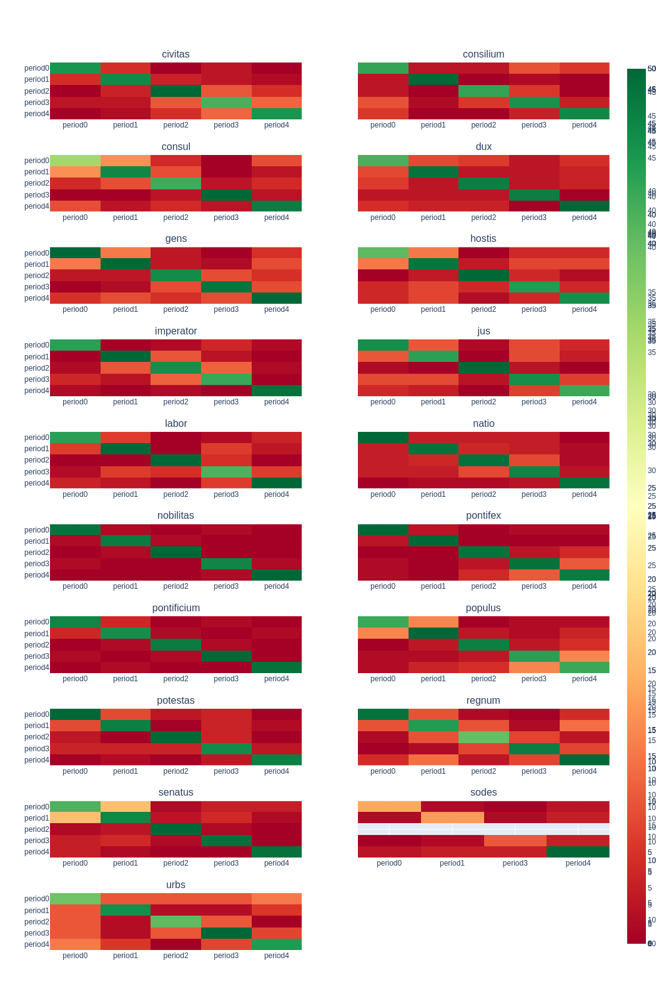

In [40]:
# plot heatmaps for every term
heatmaps = {}
for term, df in collocs_time_by_term_dfs.items():
    fig = collDiffs.plotCollDf(df, show=False)
    fig=fig.update_layout(title="Collocational overlap: "+ term)
    heatmaps.setdefault(term,fig)

fig, rows_cols = build_multiplot(2, None, len(heatmaps), [ term for term in heatmaps.keys() ],
                                 shared_yaxes=True, shared_xaxes=False, vertical_spacing=0.04)

for i, heatmap in enumerate(heatmaps.items()):
    fig.add_trace(heatmap[1]["data"][0], row=rows_cols[i][0], col=rows_cols[i][1])

fig.update_layout(height=1600, showlegend=True)
fig.update_xaxes(
                type="category",
                #title_text="Period",
                categoryorder="category ascending",
            )
fig.update_yaxes(type="category",
                 #title_text="Period",
                 categoryorder="category descending")
fig.show()

#### Diachronic overlap by term: line plot

In [41]:
# period_i:period_i+1 overlap dataframe
def simple_overlap(overlap_dict, periods):
    periods_diffs = [ x+" : "+y for x,y in itertools.pairwise(periods)]    
    overlaps = list()
    for term, overlap_arr in overlap_dict.items():
        #overlaps.setdefault(term,)
        for i, per_diff in enumerate(overlap_arr[0:len(overlap_arr)-1]):
            overlaps.append([term, periods_diffs[i], per_diff[1]])
    df = pd.DataFrame(overlaps)
    df.columns = ["term", "period", "overlap"]
    return df

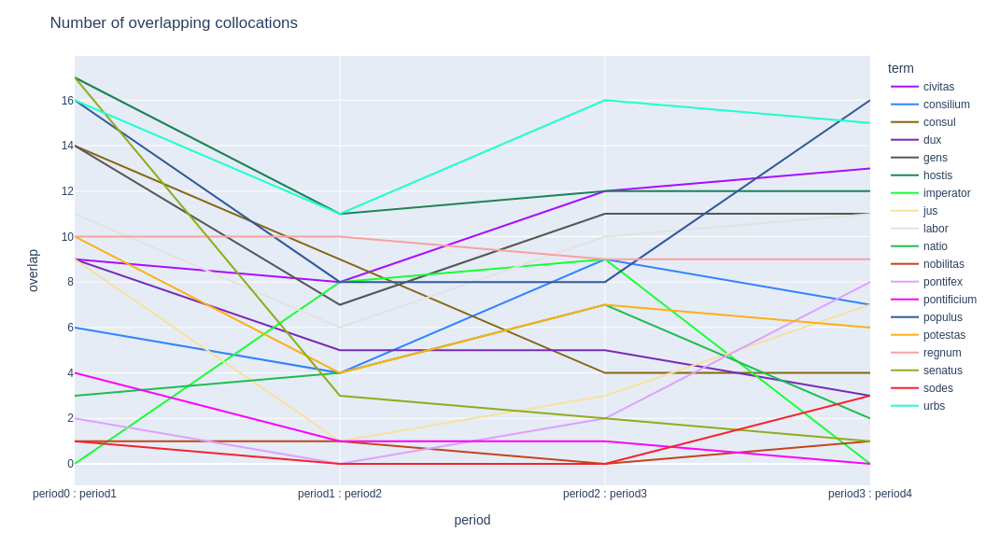

In [42]:
df = simple_overlap(collocs_time_by_term_overlap, periods)

# all
fig_all = px.line(df[df["period"] != 'period4 : period5'], x="period",y="overlap",
                  color="term", color_discrete_map=color_discrete_map_terms,
                 ) # filter out empty period
fig_all.update_layout(title="Number of overlapping collocations", height=600)
fig_all.show()

# TODO: plot change ratio instead of change count

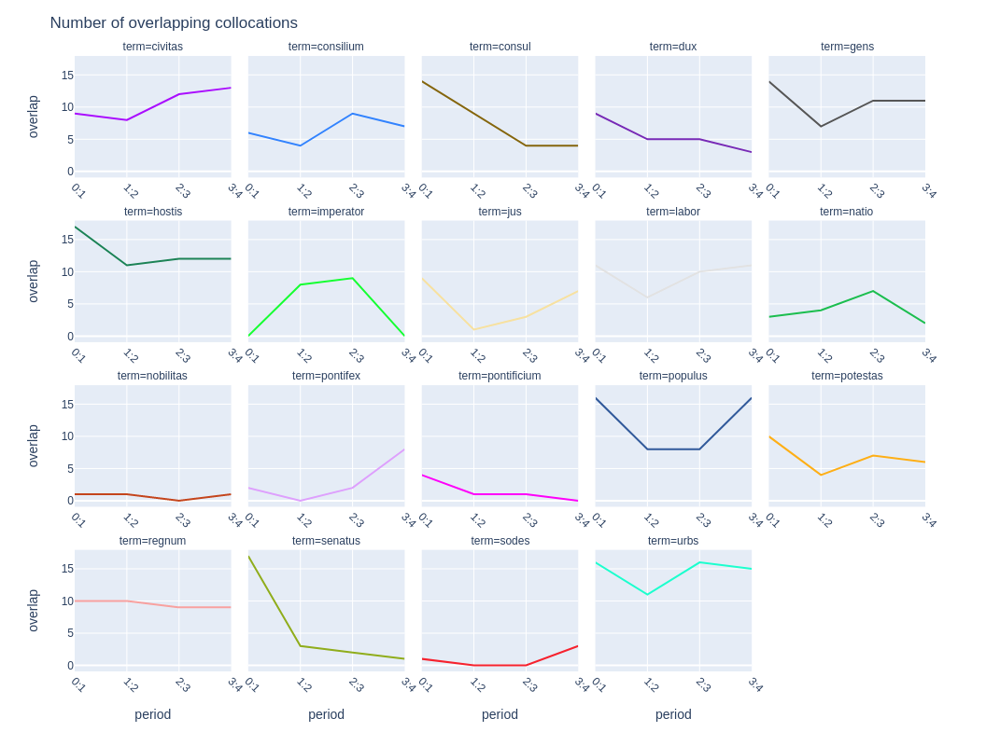

In [43]:
# by term
df_term = df[df["period"] != 'period4 : period5']
df_term["period"] = [ t1 + ":" + t2 for t1, t2 in df_term["period"].map(lambda x: re.findall('\d', x)) ] #shorter labels
fig_by_term = px.line(df_term,
                      x="period", y="overlap", color="term", # filter out empty period
                      color_discrete_map=color_discrete_map_terms,
                      facet_col="term", facet_col_wrap=5,
                     )
fig_by_term.update_layout(title="Number of overlapping collocations", height=800, showlegend=False)
fig_by_term.update_xaxes(ticks='', showticklabels=True, tickangle=45)
fig_by_term.show()
 

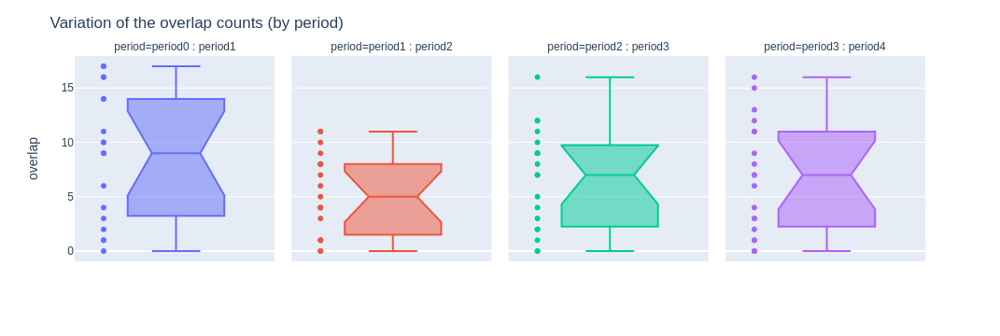

In [44]:
# by period ()
fig = px.box(df[df["period"] != 'period4 : period5'],
             y="overlap", facet_col="period", facet_col_wrap=4, facet_col_spacing=0,
             notched=True, points="all", hover_data=["term", "overlap", "period"],
             color="period", boxmode="overlay",
            )
fig.update_traces(jitter=0, showlegend=False)
fig.update_layout(title="Variation of the overlap counts (by period)", height=300, showlegend=False)
fig.show()

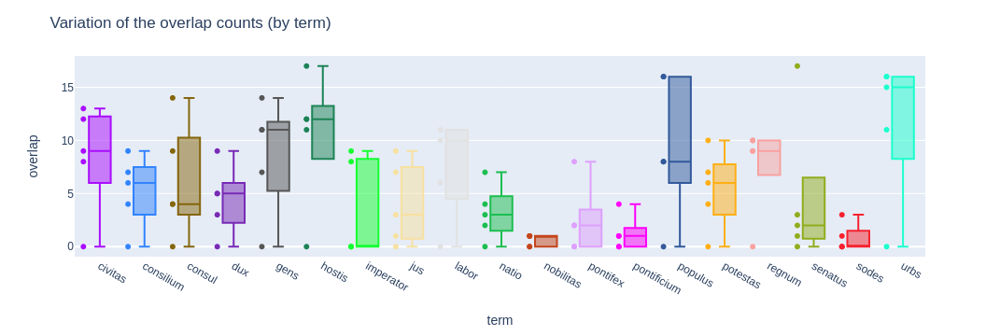

In [45]:
# by word
fig = px.box(df[df["period"] != 'period4:period5'],
             y="overlap", x="term",
             #facet_col="period",
             notched=False, 
             points="all",
             hover_data=["term", "overlap", "period"],
             color="term", color_discrete_map=color_discrete_map_terms
            )
fig.update_traces(jitter=0, showlegend=False)
fig.update_layout(title="Variation of the overlap counts (by term)", height=300, showlegend=False)
fig.show()

#### Diachronic overlap by term: sankey diagram

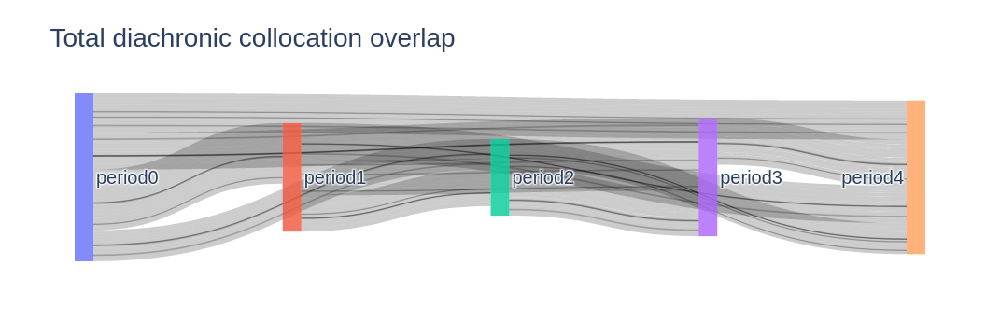

In [46]:
#terms_colors = [ color_discrete_map_terms[t] for t in overs_df_all["term"] ]

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      line = dict(color = "black", width = 0),
        label =  list(overs_df["source"].unique())
    ),
    # Add links
    link = dict(
      source =  overs_df["source"].cat.codes,
      target =  overs_df["target"].cat.codes,
      value =  overs_df["count"],
      label =  overs_df["term"],
))])

fig.update_layout(title_text="Total diachronic collocation overlap", font_size=20)
fig.show()

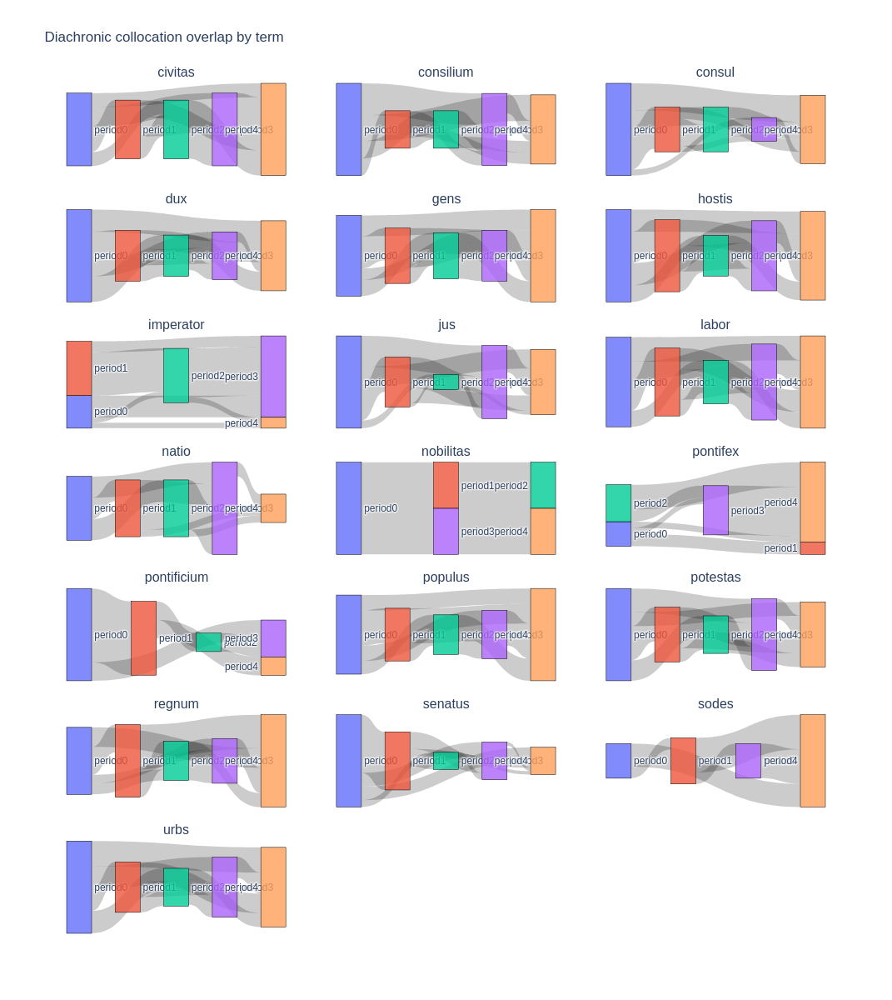

In [47]:
# prepare sankey chart of collocational overlap for every term in our set
sankeys = []
for term in socio_political_terms:
    overs_df_this = overs_df[overs_df["term"] == term].copy()
    terms_colors = [ color_discrete_map_terms[t] for t in overs_df_this["term"] ]
    fig = go.Sankey(
        arrangement="snap",
        node = dict(            
            pad = 0,
            thickness = 30,
            line = dict(color = "black", width = 0.5),
            x=[x*10 for x in range(len(periods),1)], #we force the order in which periods are plotted,
            y=[i*10 for i in range(len(periods)) ],
            label =  overs_df_this["source"].unique(),            
        ),
        # Add links
        link = dict(
            source =  overs_df_this["source"].cat.codes,
            target =  overs_df_this["target"].cat.codes,
            value =  overs_df_this["count"],
            line = dict(color = terms_colors, width = 0)
        ))
    sankeys.append(fig)
    
fig, rows_cols = build_multiplot(3, "sankey", len(sankeys), socio_political_terms,
                                 shared_yaxes=True, shared_xaxes=False, vertical_spacing=0.04)

for i, sankey in enumerate(sankeys):
    fig.add_trace(sankey, row=rows_cols[i][0], col=rows_cols[i][1])

fig.update_layout(height=1200, title_text="Diachronic collocation overlap by term")
fig.show()

### Clustering diachronic collocations

Until now, we have treated diachronic collocation sets as unstructured monoliths. In this section, we resort to word embeddings and clutering techniques in order to investigate fine-grained diachronic changes.

#### Data manipulation

We will employ word2vec embeddings to assess semantic distance between collocates.

In [48]:
model_file = '/home/krzys/Kod/streamlit/voces/data/models/latinise_IT/latinise_w2v_v100w5min5'

if rebuild == True:
    collocs_corpus = CorpusFromDir("/media/HOME_FOLDERS/krzys/Kod/streamlit/voces/data/corpora/latinise_IT_lemmas")
    collocs_model = BuildModels(collocs_corpus)
    mods = dict(word2vec=dict(vector_size=[100], # define parameters
                      window=[5],
                      min_count=[5]))
    
    latinise_w2v_v100w5min5 = collocs_model.build_many(mods)
    latinise_w2v_v100w5min5["word2vec"][0].save(model_file)
    
    model = latinise_w2v_v100w5min5["word2vec"][0]

elif rebuild == False:
    model = Word2Vec.load(model_file)

We can now annotate collocates with vectors retrieved from the word2vec model.

In [49]:
all_collocs_time = pd.concat(collocs_time_by_term_dfs) # all collocates for all terms for all periods

In [50]:
collocs = all_collocs_time["colloc"].unique() # only collocates

# find word2vec vectors for each collocate
coll_vecs = [ model.wv[x]
             if x in model.wv.key_to_index.keys() else np.repeat(None, model.wv.vector_size)
             for x in collocs ]

coll_vecs_df=pd.DataFrame(coll_vecs)
coll_vecs_df.index = collocs
not_in_model = coll_vecs_df.isna().all(axis=1)

print( len(coll_vecs_df.loc[not_in_model].index), " words weren't found in the word2vec dictionary, eg. ", [ x for x in coll_vecs_df.loc[not_in_model].index[0:10] ] )

coll_vecs_df = coll_vecs_df.loc[~not_in_model] # exclude collocates which are not found in the word2vec dictionary
coll_vecs_df.head()

384  words weren't found in the word2vec dictionary, eg.  ['intaminaverit', 'praesumptive', 'c.', 'l.', 'm.', 'q.', 'p.', 'cn.', 'num._rom.', 'turpiliano']


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
princeps,1.499599,1.654052,0.772930,1.065428,0.207113,1.949996,0.902307,-0.708749,-0.655868,0.772048,...,-1.696397,-0.042469,-0.265360,1.599047,1.692026,-0.218211,-0.866921,0.780210,-0.327714,0.286641
liber,0.553576,-1.277259,0.313765,1.584810,-0.664978,0.322391,-0.498039,-0.519350,0.641134,-0.344159,...,-0.276185,-1.019836,0.291666,-0.113171,-0.189848,-0.048001,-1.822827,0.121390,1.108394,-0.997175
dono,-0.028665,0.206296,-0.636952,-0.976660,-1.009025,1.534521,-0.018601,0.419318,1.731939,0.566920,...,-0.035175,0.146910,1.603500,1.170355,1.732852,-1.009020,0.818321,-0.086363,-0.048242,-1.025009
noster,1.572031,-1.847746,0.483166,1.169696,0.515046,1.342866,4.558844,0.564918,1.128803,-1.010498,...,-1.073775,0.294596,0.294962,0.136875,0.365881,0.431258,-0.813561,1.461542,1.295876,0.666016
universus,1.921788,0.015745,-0.242650,0.499856,1.337168,0.055342,2.049455,-0.873691,-0.782762,0.550108,...,-1.849260,-0.296087,-0.577653,0.448051,0.129755,-1.951933,0.501837,-1.916079,0.115764,-0.859761


#### Cluster computation

Each collocate will be assigned to a cluster basing on the vector. In this study, we use **k-means clustering** with an arbitrary number of **10 clusters**.

In [51]:
cluster_n = 10
kmeans = KMeans(n_clusters=cluster_n).fit_predict(coll_vecs_df) # (1) initialize the model and (2) fit and return predictions
kmeans_dict = dict(zip(coll_vecs_df.index ,kmeans)) # for easy access we create a dictionary: {"term", "cluster"}
cluster_color_map = { str(i) : px.colors.qualitative.Safe[i] for i in range(0,cluster_n+1) } # for each term we fix a color

We can now annotate all collocates with cluster label.

In [52]:
all_collocs_time["kmeans_cluster"] = pd.Categorical(all_collocs_time.apply(lambda x: str(kmeans_dict[x["colloc"]]) if x["colloc"] in kmeans_dict.keys() else None, axis=1 ))
all_collocs_time = all_collocs_time.reset_index(level=1, drop=True)
all_collocs_time = all_collocs_time.reset_index()
all_collocs_time = all_collocs_time.rename(columns={"index":"term"})
all_collocs_time

,term,colloc,slice,rank,kmeans_cluster
0,civitas,princeps,period0,1,8
1,civitas,liber,period0,2,9
2,civitas,dono,period0,3,5
3,civitas,noster,period0,4,4
4,civitas,universus,period0,5,8
...,...,...,...,...,...
4583,urbs,vix,period4,46,0
4584,urbs,proficiscor,period4,47,8
4585,urbs,lapis,period4,48,0
4586,urbs,nobilis,period4,49,7


#### Distribution of collocation clusters through time

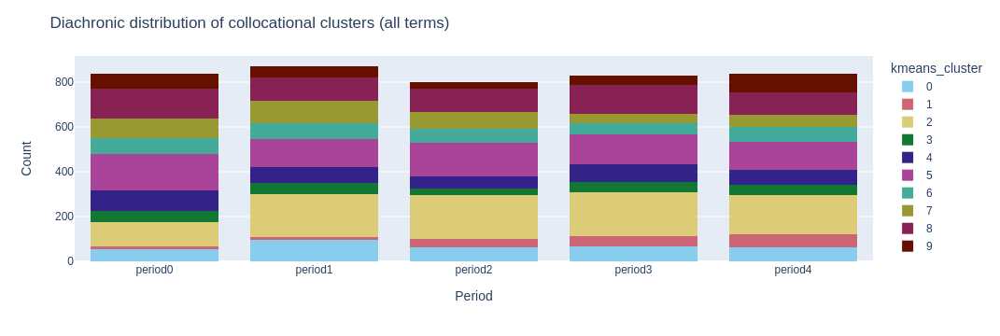

In [53]:
fig = px.histogram(all_collocs_time.sort_values("kmeans_cluster"), x="slice",
                   color="kmeans_cluster", color_discrete_map=cluster_color_map,
                   barmode="stack",
                   category_orders={"kmeans_cluster":'category ascending'},
                   )
fig.update_xaxes(title="Period", categoryorder="category ascending" )
fig.update_yaxes(title="Count")
fig.update_layout(title="Diachronic distribution of collocational clusters (all terms)")
fig.show()

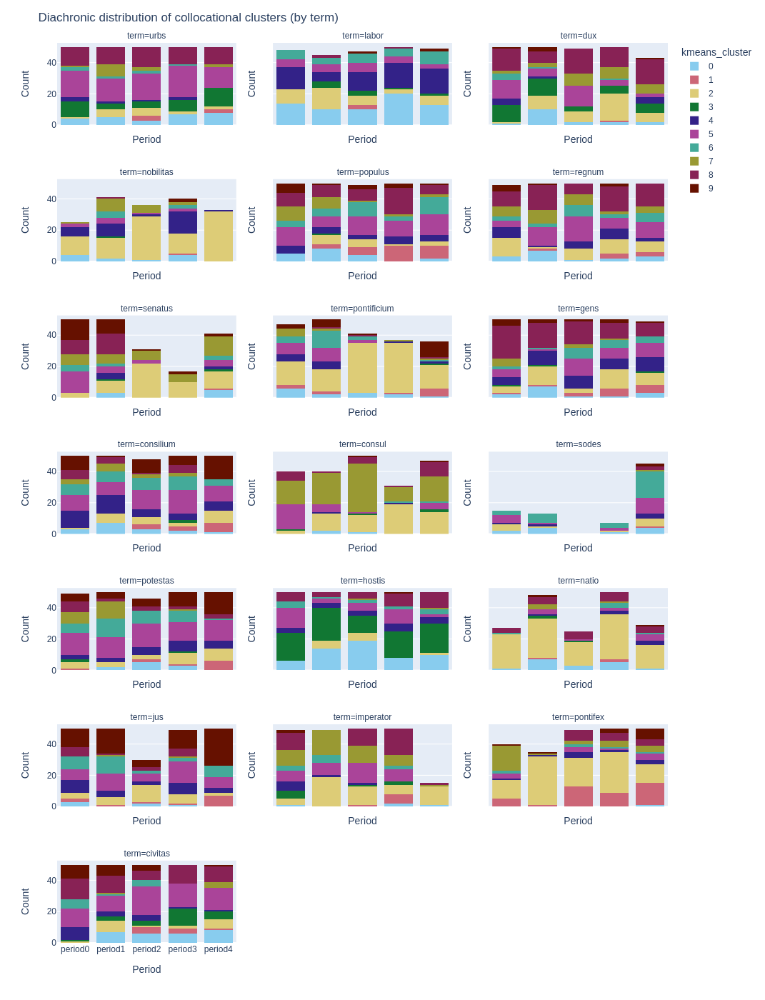

In [54]:
fig = px.histogram(all_collocs_time.sort_values("kmeans_cluster"),
                   x="slice", color=("kmeans_cluster"), color_discrete_map=cluster_color_map,
                   barmode="stack",
                   category_orders={"kmeans_cluster":'category ascending'},
                   facet_col="term",
                   facet_col_wrap=3,
                   facet_row_spacing=0.06,
                   facet_col_spacing=0.06,)
fig.update_xaxes(title="Period", categoryorder="category ascending" )
fig.update_yaxes(title="Count")
fig.update_layout(height=1400, showlegend=True, title="Diachronic distribution of collocational clusters (by term)")
fig.show()

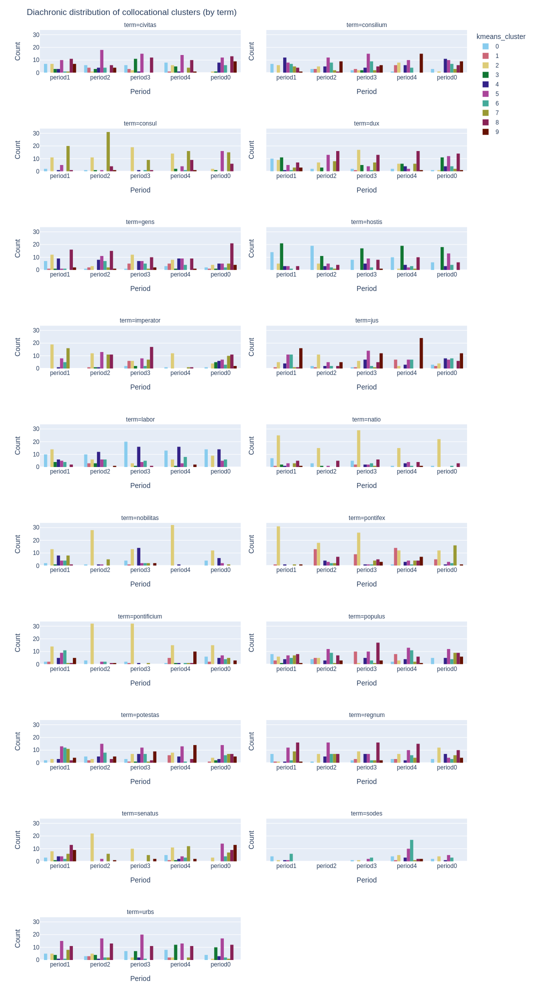

In [55]:
fig = px.histogram(all_collocs_time, x="slice", color="kmeans_cluster", barmode="group",
                   facet_col="term", color_discrete_map=cluster_color_map,
                   facet_col_wrap=2,
                   category_orders={"kmeans_cluster":[str(i) for i in range(0,cluster_n+1) ]},
                   facet_row_spacing=0.06,
                   facet_col_spacing=0.06,
                   )
                  
fig.update_xaxes(title="Period", showticklabels=True)
fig.update_yaxes(title="Count")
fig.update_layout(height=2000, showlegend=True, title="Diachronic distribution of collocational clusters (by term)")
fig.show()

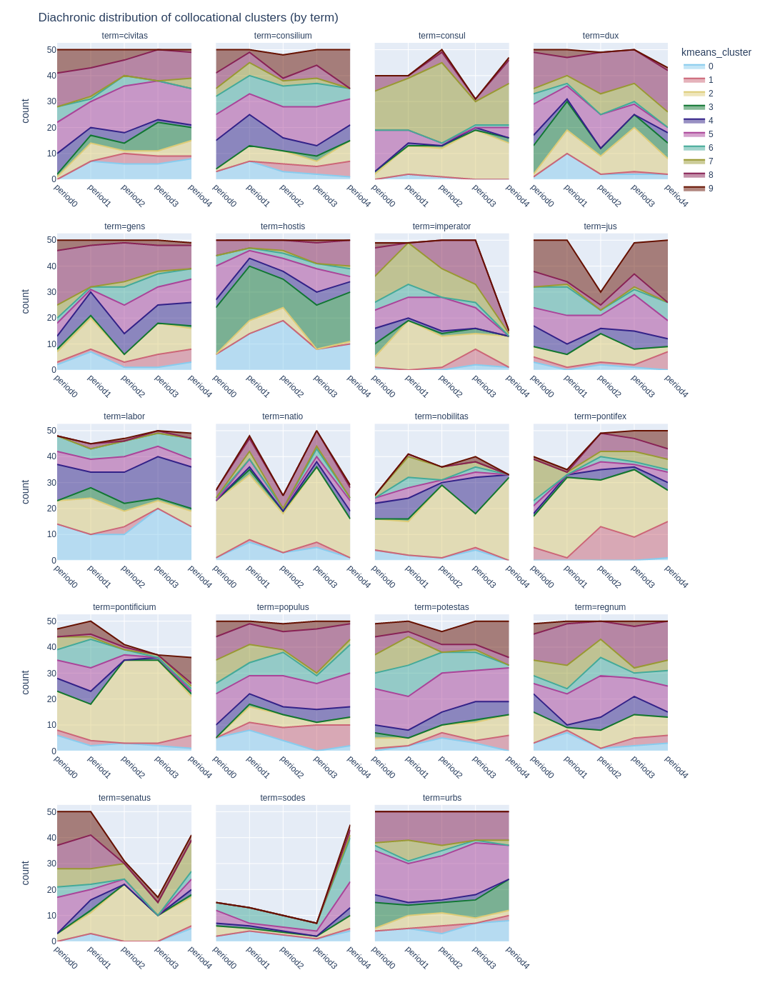

In [56]:
df = pd.DataFrame(all_collocs_time.groupby(["slice", "term"])["kmeans_cluster"].value_counts().reset_index())
df.columns = ["slice", "term","kmeans_cluster", "count"]
#df[df["term"] == 'civitas'].head()

fig = px.area(df, x="slice", color="kmeans_cluster", color_discrete_map=cluster_color_map,
                  y="count", category_orders={"kmeans_cluster":[str(i) for i in range(0,cluster_n+1) ]},
                   facet_col="term", facet_col_wrap=4,
                   facet_row_spacing=0.06, facet_col_spacing=0.04,
                   )
fig.update_xaxes(title="", categoryorder="category ascending", showticklabels=True, tickangle=45)
fig.update_layout(height=1400, showlegend=True, title="Diachronic distribution of collocational clusters (by term)")
fig.show()

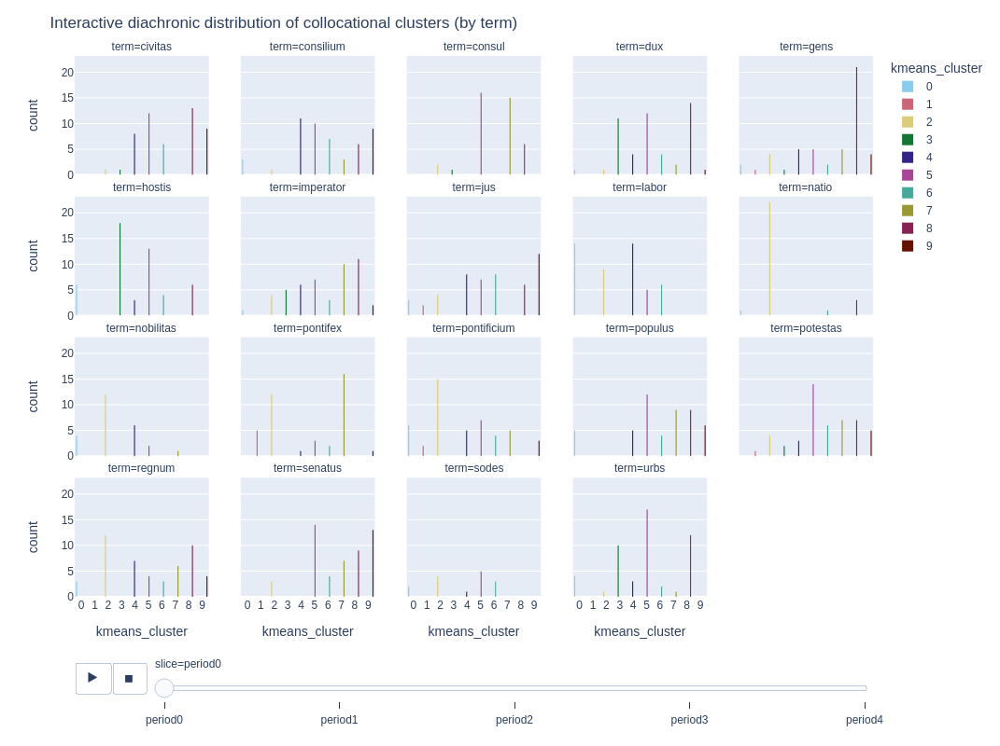

In [57]:
fig = px.histogram(all_collocs_time,
                   x="kmeans_cluster", color="kmeans_cluster",
                   barmode="group",
                   facet_col="term",
                   color_discrete_map=cluster_color_map,
                   facet_col_wrap=5, 
                   animation_frame="slice", animation_group="kmeans_cluster",
                   category_orders={"kmeans_cluster":[str(i) for i in range(0,cluster_n+1) ]},
                   facet_row_spacing=0.04, facet_col_spacing=0.04,
                   )

fig.update_layout(height=800, showlegend=True, title="Interactive diachronic distribution of collocational clusters (by term)")
fig.show()

#### Variation of collocation clusters through time
Let's assume that the distribution of collocational clusters of a term at time_i corresponds to its semantics at this point in time. Diachronic variation of the counts may help us in assessing if the term was subject to important sense changes.

**TODO** It might be better, though, to evaluate the cross-cluster variation rather than one-cluster counts.

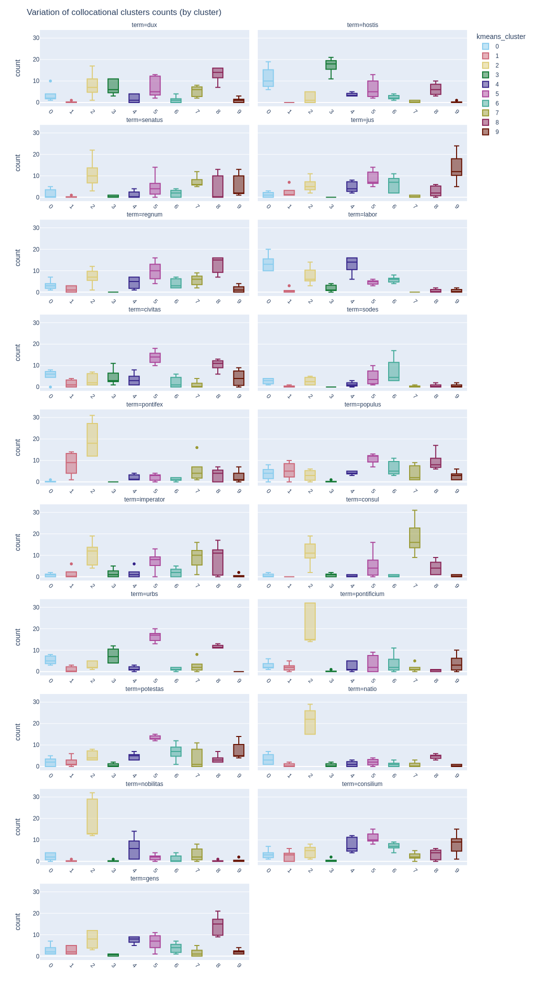

In [58]:
fig = px.box(df.sort_values("kmeans_cluster"), x="kmeans_cluster",
             color="kmeans_cluster", color_discrete_map=cluster_color_map,
             y="count",
             facet_col="term", facet_col_wrap=2,
             facet_row_spacing=0.02, facet_col_spacing=0.02,
             category_orders={"kmeans_cluster":'category ascending'},
            )
fig.update_xaxes(title="", categoryorder="category ascending", showticklabels=True, tickangle=45)
fig.update_layout(height=2000, showlegend=True, title="Variation of collocational clusters counts (by cluster)")
fig.show()

In [59]:
# TODO: variation by genre

### Semantic relatedness of collocations through time

#### Data manipulation

We're evaluating semantic (dis)similarity of collocates based on vectors retrieved from the word2vec model. To facilitate analyses, we are building similarity matrix for all collocates at once.

In [60]:
print("The model we'll be using: ", model, ".\n")
similarity_matrix = np.matrix([ model.wv.cosine_similarities(vec1, coll_vecs_df) for vec1 in coll_vecs_df.to_numpy() ])
print("Our similarity matrix has shape: ", similarity_matrix.shape, "\n", similarity_matrix[0:2])
#dist_matrix = distance.pdist(np.ndarray([ coll_vecs_df[0:2], coll_vecs_df[0:2]]).dropna(), metric='cosine')

The model we'll be using:  Word2Vec<vocab=40504, vector_size=100, alpha=0.025> .

Our similarity matrix has shape:  (1960, 1960) 
 [[ 1.          0.23384352  0.29489333 ... -0.03872494  0.21011936
  -0.25082798]
 [ 0.23384352  1.          0.25128823 ... -0.02935744  0.1194429
  -0.01803547]]


Also, for plotting purposes, we are reducing vectors to 2 dimensions with the t-SNE.

In [61]:
tsne_df = all_collocs_time[["colloc", "slice", "term", "rank"]].reset_index(drop=True)
tsne_df = tsne_df.set_index("colloc", drop=False)
tsne_df["vec"] = [ coll_vecs_df.loc[colloc] if colloc in coll_vecs_df.index else None for colloc in tsne_df["colloc"] ]
tsne_df = tsne_df[ ~ tsne_df["vec"].isna()] # exclude collocates not in the word2vec dict

# fit TSNE
vecs = tsne_df["vec"]
vecs = np.array([ vec for vec in vecs ])
tsne = TSNE(n_components=2, random_state=0, init='pca', learning_rate="auto", metric="cosine", perplexity=len(periods))
coords = tsne.fit_transform( vecs )

# add (x,y) coordinates to each row
tsne_df["x"] = [ coord[0] for coord in coords ]
tsne_df["y"] = [ coord[1] for coord in coords ]
tsne_df["rank"] = pd.to_numeric(tsne_df["rank"])

tsne_df.head()

/home/krzys/Programy/anaconda3/envs/lvlt22/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



,colloc,slice,term,rank,vec,x,y
colloc,,,,,,,
princeps,princeps,period0,civitas,1,0 1.499599 1 1.654052 2 0.772930 3...,16.972206,126.714470
liber,liber,period0,civitas,2,0 0.553576 1 -1.277259 2 0.313765 3...,-61.058674,89.738022
dono,dono,period0,civitas,3,0 -0.028665 1 0.206296 2 -0.636952 3...,-58.684277,-27.740314
noster,noster,period0,civitas,4,0 1.572031 1 -1.847746 2 0.483166 3...,-112.982780,73.323967
universus,universus,period0,civitas,5,0 1.921788 1 0.015745 2 -0.242650 3...,57.741444,101.088272


#### Semantic relatedness of diachronic collocations: zoom on node word

Diachronic collocations may be clustered based on their semantic similarity.

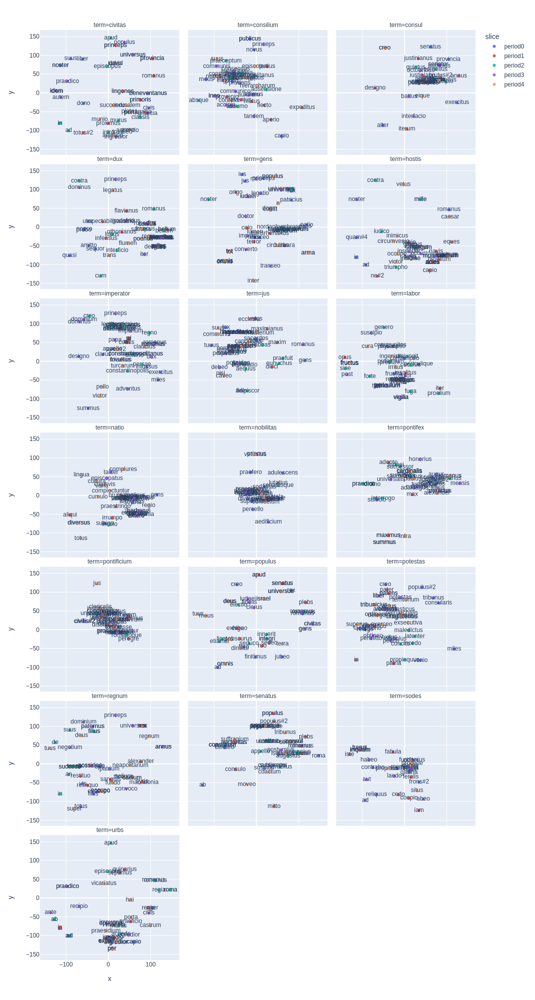

In [62]:
# all: only strongest collocates
topn = 10
tsne_df[tsne_df["rank"] <= topn ]
fig = px.scatter(tsne_df[tsne_df["rank"] <= topn], x="x", y="y", color="slice", text="colloc", facet_col="term",
                 facet_col_wrap=3, facet_row_spacing=0.01)
fig.update_layout(height=2000)
fig.show()

The same data may be visualized dynamically.

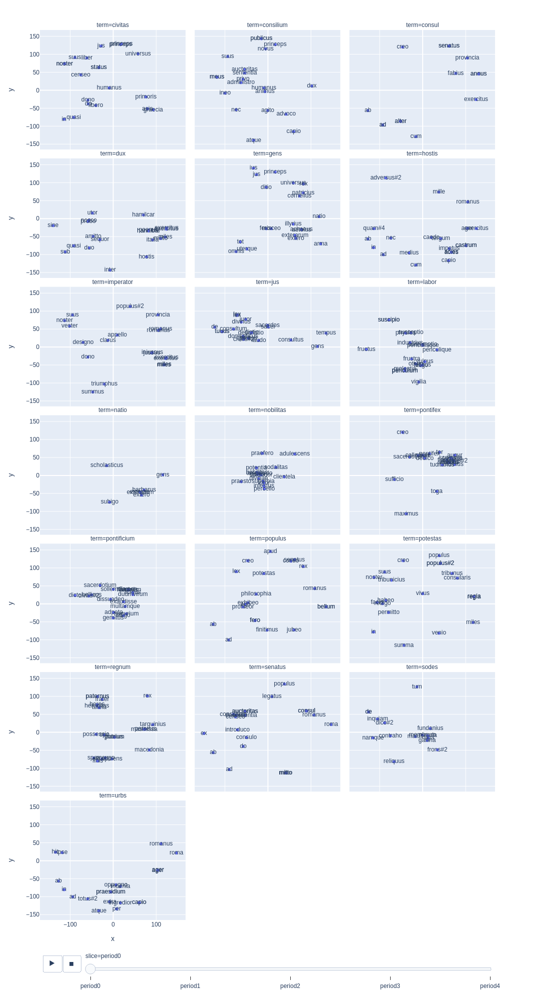

In [63]:
# all: only strongest collocates
topn = 20
fig = px.scatter(tsne_df[tsne_df["rank"] <= topn], x="x", y="y", color="slice", text="colloc", facet_col="term",
                 animation_frame="slice",
                 facet_col_wrap=3, facet_row_spacing=0.01)
fig.update_layout(height=2000, showlegend=False)
fig.show()

Usually, it is easier to analyze terms one by one.

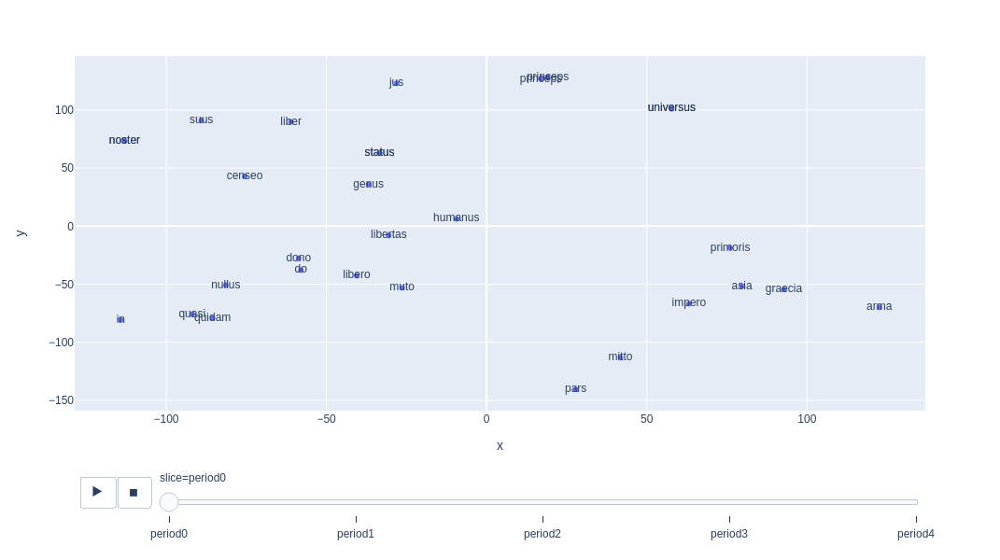

In [64]:
# all: only strongest collocates
topn = 30
term = 'civitas'
fig = px.scatter(tsne_df[ (tsne_df["rank"] <= topn) & (tsne_df["term"] == term) ], x="x", y="y", color="slice", text="colloc",
                 animation_frame="slice",
                
                )
fig.update_layout(height=600, showlegend=False)
fig.show()

#### Semantic relatedness of diachronic collocations: zoom on period
Let's evaluate semantic similarity of all collocates of all terms for each period.

**TODO** The plot is, however, hardly legible and difficult to interpret.

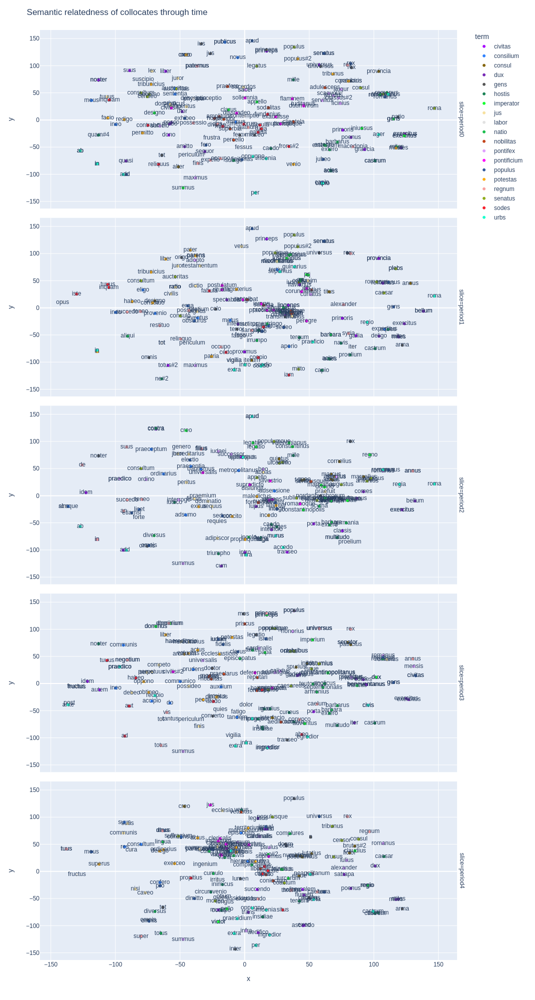

In [65]:
# all: only strongest collocates - by period - unreadable
topn = 10
tsne_df[tsne_df["rank"] <= topn ]
fig = px.scatter(tsne_df[tsne_df["rank"] <= topn], x="x", y="y",
                 color="term", text="colloc", color_discrete_map=color_discrete_map_terms,
                 #facet_col="term",
                 facet_row="slice",
                 facet_col_wrap=2,
                 facet_row_spacing=0.01)
fig.update_layout(height=2000, title="Semantic relatedness of collocates through time")
fig.show()

#### Semantic change of the diachronic collocation sets

Let's assume that semantic value of a collocational set at the point t_i is approximated by the mean of the vectors of its elements.

In [66]:
# TODO: Evaluate if and how the mean is correlated with the rank of collocates included in the set.

First, we calculate vector means for each term-period.

In [67]:
df_sims = tsne_df[~ tsne_df["vec"].isna() ].groupby(["term","slice"])["vec"].aggregate(lambda x: cosine_similarity([y for y in x]) ).reset_index()
df_sims["mean_sim"] = df_sims.apply(lambda x: np.mean(np.tril(x["vec"], k=-1)), axis=1 ) # get the lower triangle of the matrix
df_sims["std_sim"] = df_sims.apply(lambda x: np.std(np.tril(x["vec"], k=-1)), axis=1 )


We are now ready to plot the means for each term for each period. If the mean of collocation set vectors significantly changes, we may suppose the meaning of the term changed as well.

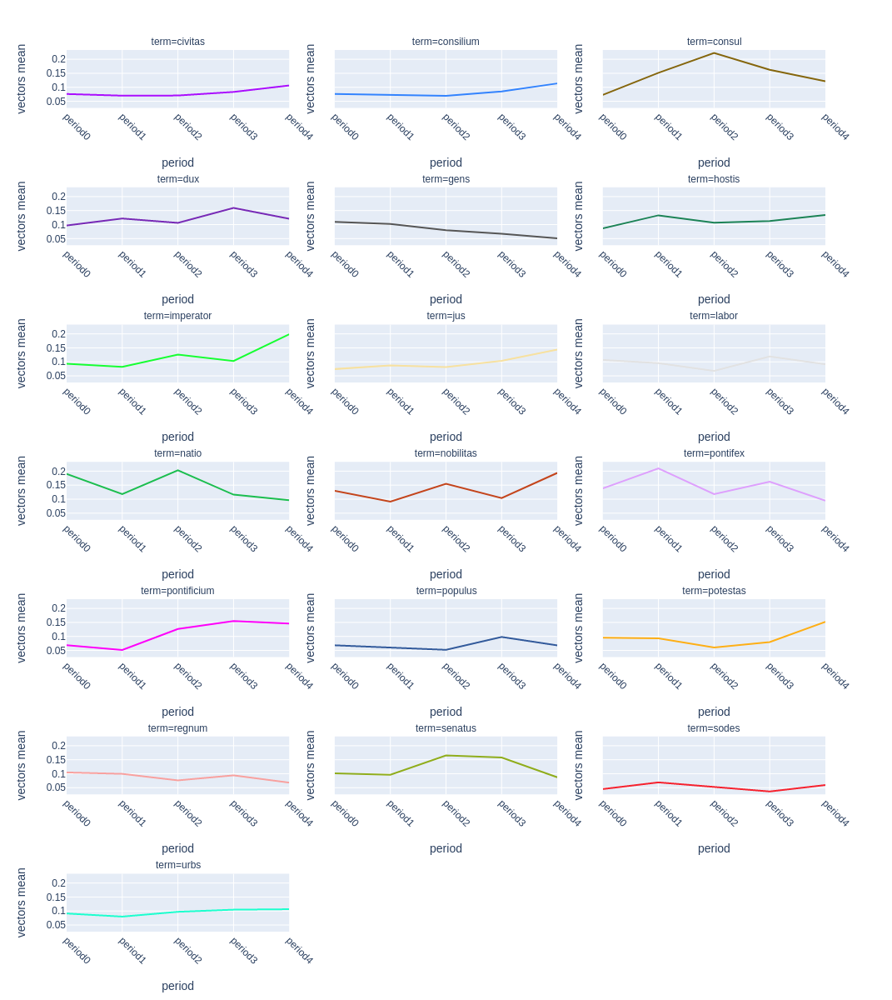

In [68]:
fig = px.line(
    df_sims,
    x="slice",
    y="mean_sim",
    color="term", color_discrete_map=color_discrete_map_terms,
    facet_col="term", facet_col_wrap=3, facet_row_spacing=0.09, facet_col_spacing=0.06
) # collocational set coherence
fig.update_layout(height=1200, showlegend=False)
fig.update_yaxes(title="vectors mean")
fig.update_xaxes(title="period", showticklabels=True, tickangle=45)
fig.show()

If the vectors mean is indicative of the word meaning, we may calculate the cosine similarity of the term-periods and plot the on the 2D plane by reducing the vectors with the t-SNE.

In [69]:
df_sims_vecs = tsne_df[~ tsne_df["vec"].isna() ].copy().groupby(["term","slice"])["vec"].aggregate(vec_mean=lambda x: np.mean( [y for y in x], axis = 0 ) ).reset_index()

# computet coordinates
tsne = TSNE(n_components=2, random_state=0, init='pca', learning_rate="auto", metric="cosine", perplexity=len(periods))
coords = tsne.fit_transform( np.array([ x for x in df_sims_vecs["vec_mean"] ]) )
df_sims_vecs["x"] = [coord[0] for coord in coords]
df_sims_vecs["y"] = [coord[1] for coord in coords]
df_sims_vecs["label"] = df_sims_vecs.apply(lambda x: x["term"] + ":" + x["slice"], axis=1)
df_sims_vecs.head()

/home/krzys/Programy/anaconda3/envs/lvlt22/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



,term,slice,vec_mean,x,y,label
0,civitas,period0,"[0.6263095027115196, 0.5174619818106294, 0.625...",-10.971476,0.867808,civitas:period0
1,civitas,period1,"[0.2820856557949446, 0.6225982517749071, 0.477...",6.380172,1.675987,civitas:period1
2,civitas,period2,"[0.11355138320475816, 0.5428241047263146, 0.42...",51.639301,1.494962,civitas:period2
3,civitas,period3,"[0.19769961521029472, 0.654884631484747, 0.421...",51.614822,-3.667052,civitas:period3
4,civitas,period4,"[0.1574401219189167, 0.5192894107103347, 0.147...",53.433056,-2.697327,civitas:period4


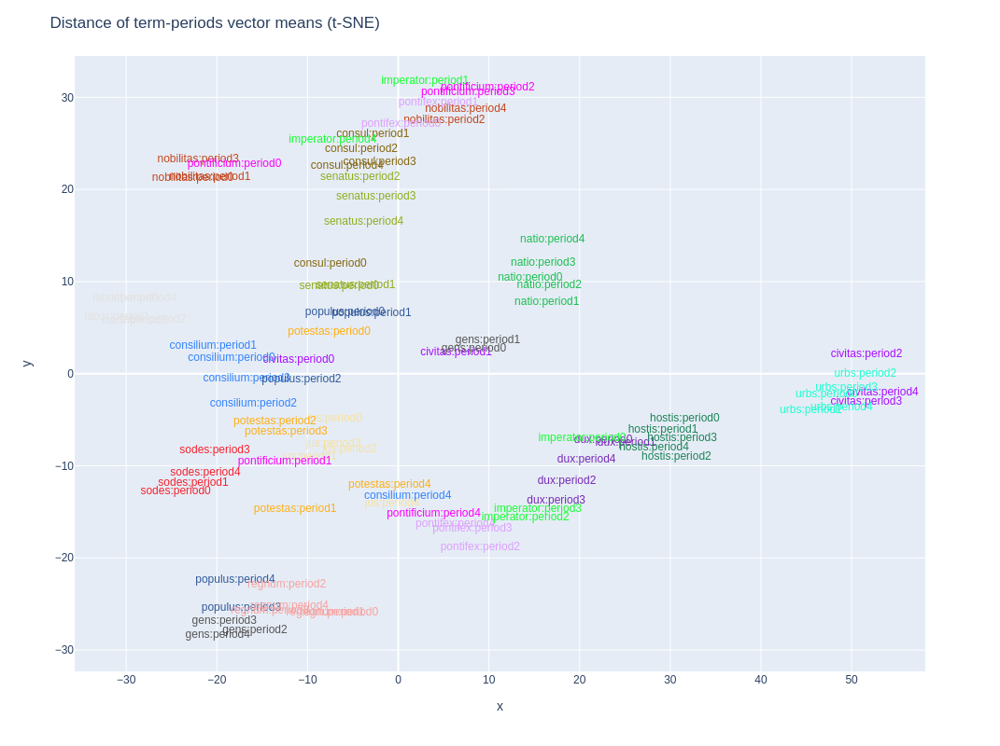

In [70]:
fig = px.scatter(df_sims_vecs, x="x", y="y",
                 color="term", text="label", color_discrete_map=color_discrete_map_terms,
                )
fig.for_each_trace(lambda t: t.update(textfont_color=t.marker.color, textposition='top center'))
fig.update_traces(mode="text")
fig.update_layout(height=800, showlegend=False, title="Distance of term-periods vector means (t-SNE)")
fig.show()

The cosine similarity of term-periods may be also investigated on a heatmap.

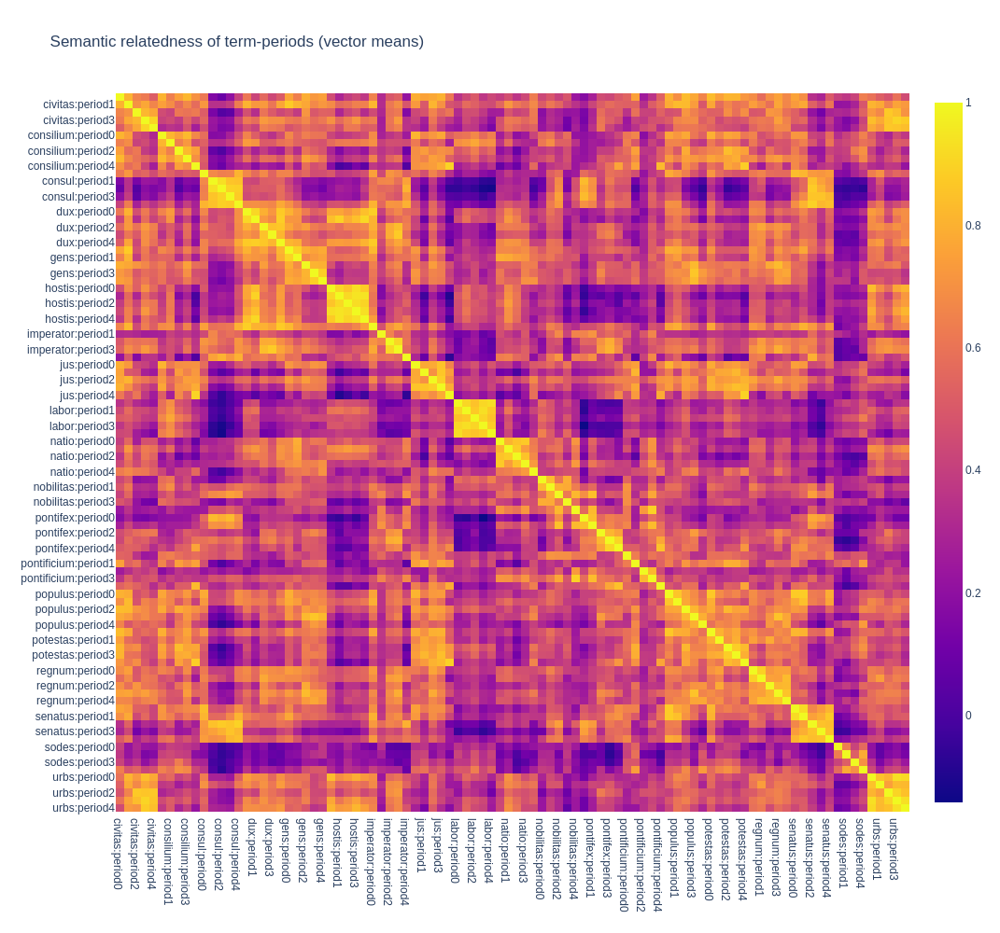

In [71]:
# similarity between periods and terms
df_sims_vecs_cosine = cosine_similarity([ row for row in df_sims_vecs["vec_mean"] ])

labels = [ row for row in df_sims_vecs["label"] ]
fig = go.Figure(
    data=go.Heatmap(
        x=labels,
        y=labels,
        z=df_sims_vecs_cosine
    )
)
fig.update_layout(height=1000, title="Semantic relatedness of term-periods (vector means)")
fig.update_yaxes(categoryorder='category descending')
fig.update_xaxes(categoryorder='category ascending')
fig.show()

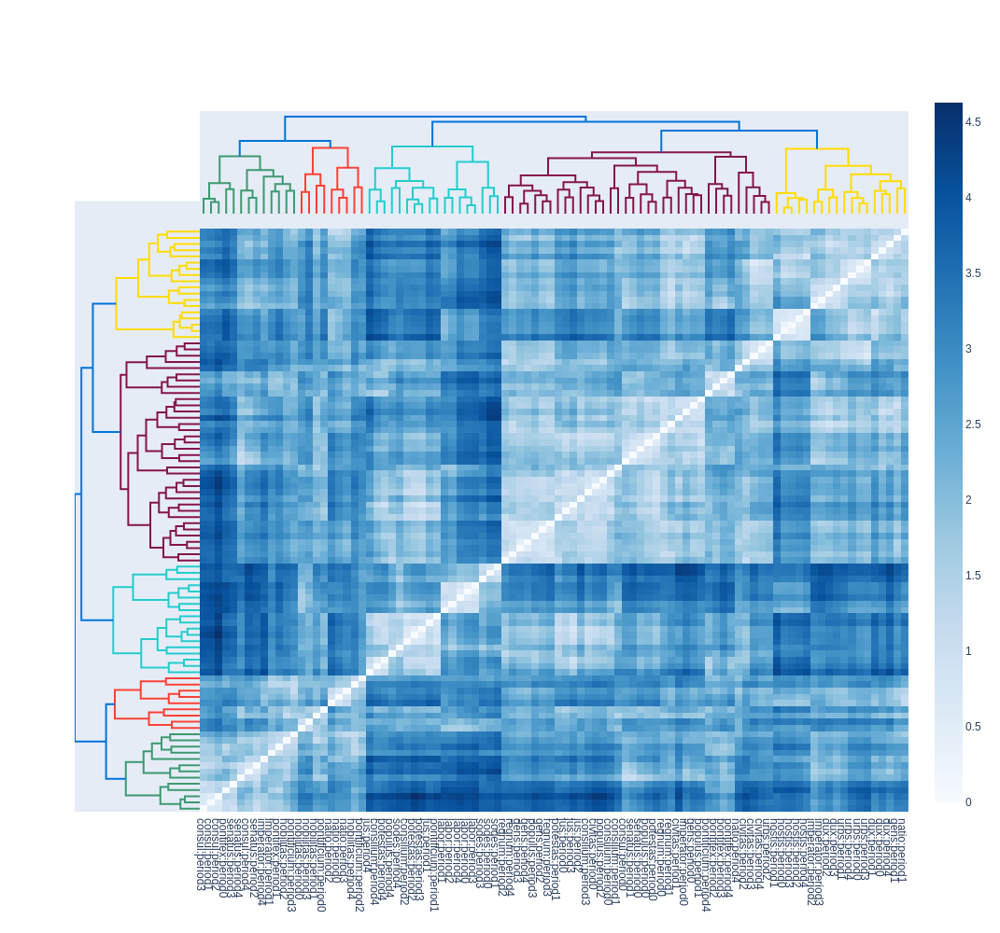

In [72]:
# heatmap with dendrogram following the example at https://plotly.com/python/dendrogram/#plot-a-dendrogram-with-a-heatmap

data_array = df_sims_vecs_cosine
data_array = data_array.transpose()
labels = [ row for row in df_sims_vecs["label"] ]

# Initialize figure by creating upper dendrogram
fig = ff.create_dendrogram(data_array, orientation='bottom', labels=labels)
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

# Create Side Dendrogram
dendro_side = ff.create_dendrogram(data_array, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = distance.pdist(data_array)
heat_data = distance.squareform(data_dist)
heat_data = heat_data[dendro_leaves,:]
heat_data = heat_data[:,dendro_leaves]

heatmap = [
    go.Heatmap(
        x = dendro_leaves,
        y = dendro_leaves,
        z = heat_data,
        colorscale = 'Blues'
    )
]

heatmap[0]['x'] = fig['layout']['xaxis']['tickvals']
heatmap[0]['y'] = dendro_side['layout']['yaxis']['tickvals']

# Add Heatmap Data to Figure
for data in heatmap:
    fig.add_trace(data)

# Edit Layout
fig.update_layout({'width':800, 'height':800,
                         'showlegend':False, 'hovermode': 'closest',
                         })
# Edit xaxis
fig.update_layout(xaxis={'domain': [.15, 1],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'ticks':""})
# Edit xaxis2
fig.update_layout(xaxis2={'domain': [0, .15],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Edit yaxis
fig.update_layout(yaxis={'domain': [0, .85],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'showticklabels': False,
                                  'ticks': ""
                        })
# Edit yaxis2
fig.update_layout(yaxis2={'domain':[.825, .975],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Plot!
fig.update_layout(height=1000, width=1000)
fig.show()

In [73]:
# qualitative flow of collocates
collocs_time_by_term_dfs["civitas"]

,colloc,slice,rank
0,princeps,period0,1
1,liber,period0,2
2,dono,period0,3
3,noster,period0,4
4,universus,period0,5
...,...,...,...
245,et,period4,46
246,ager,period4,47
247,mons,period4,48
248,usque,period4,49


#### Collocational similarity (network approach)

Let's represent collocations of a term or a set of terms as a graph. The node set comprises of all the collocates of a terms or terms as well as the terms themselves. The edges link collocate nodes with the respective term nodes. The edges are assigned a `weight` attribute which defines nodes attraction and whose value is inversely proportional to the collocation rank: $1-(rank/max(rank))$.

**TODO** More rigorous definition.

In [74]:
net_df = pd.DataFrame()
for term, dataf in collocs_time_by_term_dfs.items():
    dataf = dataf.assign(term = pd.Series([x for x in itertools.repeat(term,len(dataf.index))]))
    net_df = pd.concat([net_df, dataf]) 
net_df['slice_term'] = net_df['term'] + '_' + net_df['slice'].str.replace('period','')
net_df = net_df.assign(weight = pd.to_numeric(1-pd.to_numeric(net_df["rank"])/pd.to_numeric(net_df["rank"]).max()))

net_df.head()

,colloc,slice,rank,term,slice_term,weight
0,princeps,period0,1,civitas,civitas_0,0.98
1,liber,period0,2,civitas,civitas_0,0.96
2,dono,period0,3,civitas,civitas_0,0.94
3,noster,period0,4,civitas,civitas_0,0.92
4,universus,period0,5,civitas,civitas_0,0.90


Since collocate nodes may be linked to multiple terms, intuitively, the network may be used to assess degree of semantic relatedness between the terms. To increase legibility we will plot only 20 strongest collocates,

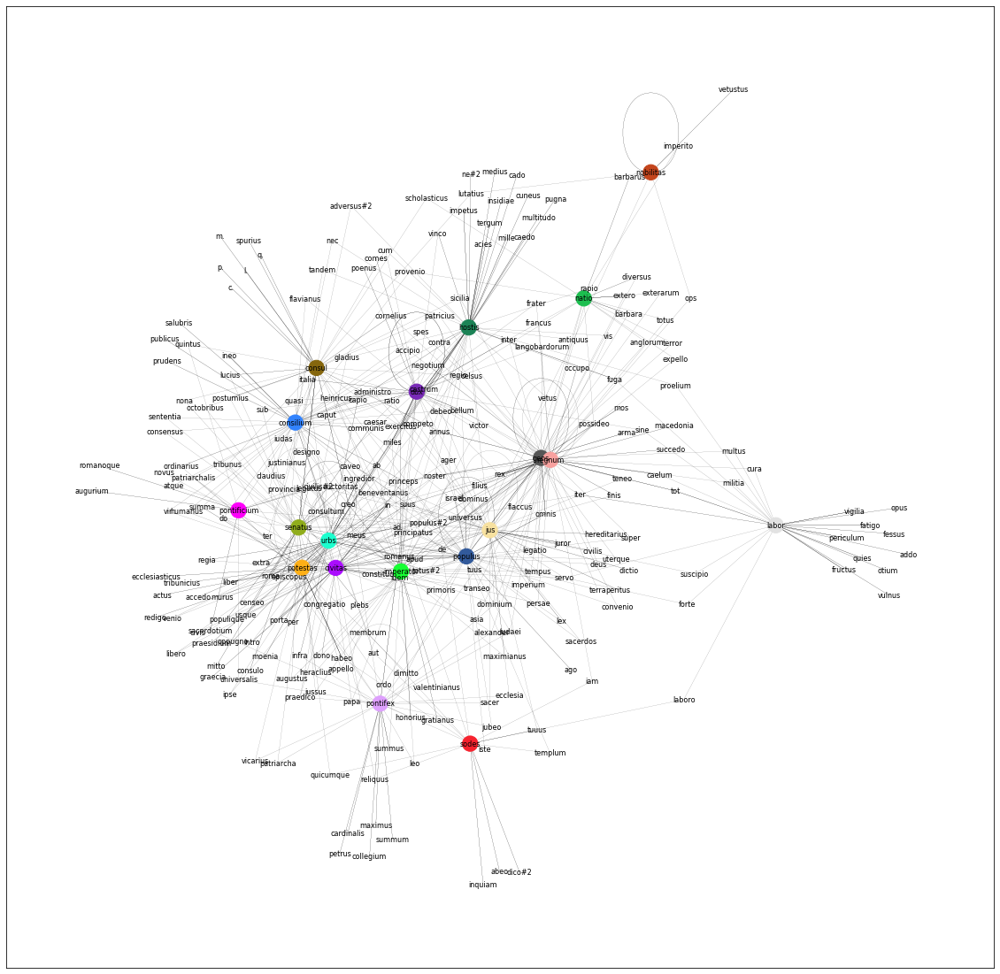

In [75]:
rank_thresh = 20
g = nx.from_pandas_edgelist(net_df[ pd.to_numeric(net_df["rank"]) <= rank_thresh ],source="colloc", target="term",edge_key="slice",
                            edge_attr=["weight", "slice"], create_using=nx.MultiGraph())

# remove low-degree nodes, ie. nodes that are linked to only 1 node
low_degree = [n for n, d in g.degree() if d < 2]
g.remove_nodes_from(low_degree)
node_colors = [ color_discrete_map_terms[node] if  node in color_discrete_map_terms.keys() else '#808080' for node in g.nodes ]
node_sizes = [ 300 if  node in color_discrete_map_terms.keys() else 0 for node in g.nodes ]
pos = nx.spring_layout(g, seed=1)

plt.figure(1,figsize=(20,20)) 
nx.draw_networkx(g, pos, width=0.1, node_color=node_colors, node_size=node_sizes, font_size=8)

The networks may be inspected period by period. 

In [76]:
graphs = []
rank_thresh = 20
for i, period in enumerate(periods[0:len(periods)-1]):
    g = nx.from_pandas_edgelist(net_df[ (net_df["slice"] == period) & (pd.to_numeric(net_df["rank"]) <= rank_thresh) ],source="colloc", target="term",edge_key="slice",
                            edge_attr=["weight", "slice"], create_using=nx.MultiGraph())
    # remove low-degree nodes
    low_degree = [n for n, d in g.degree() if d < 2]
    g.remove_nodes_from(low_degree)
    node_colors = [ color_discrete_map_terms[node] if  node in color_discrete_map_terms.keys() else '#808080' for node in g.nodes ]
    node_sizes = [ 300 if  node in color_discrete_map_terms.keys() else 0 for node in g.nodes ]
    font_sizes = [ 12 if  node in color_discrete_map_terms.keys() else 4 for node in g.nodes ]
    pos = nx.spring_layout(g, seed=675, k=0.99)
    graphs.append((g, pos, node_colors, node_sizes, period))

2 3


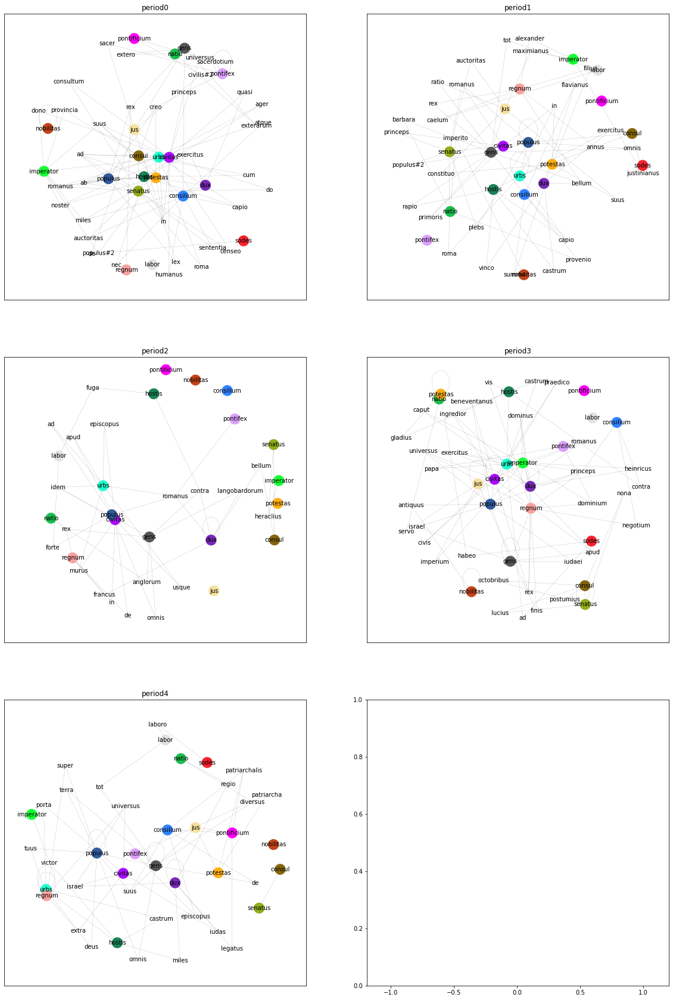

In [77]:
ncols = 2
nrows = divmod(len(graphs), ncols)[0] if divmod(len(graphs), ncols)[1] == 0 else divmod(len(graphs), ncols)[0] + 1
print(ncols, nrows)
fig, axs = plt.subplots( nrows , ncols, sharex=True, figsize=(20, 30))

for i, graph in enumerate(graphs):    
    ax = axs.flatten()
    ax[i].set_title(graphs[i][4])
    nx.draw_networkx(graphs[i][0], graphs[i][1], width=0.1, node_color=graphs[i][2], 
                     node_size=graphs[i][3],
                     font_size=10,
                     ax=ax[i])

Likewise, the (dis)similarity may be evaluated for term-periods. This time, we are using `nx.algorithms.community.greedy_modularity_communities` algorithm with to detect "communities" (ie. sense clusters) in the network. 

**TODO** Improve legibility or remove.

In [78]:
rank_thresh = 10
g = nx.from_pandas_edgelist(net_df[ pd.to_numeric(net_df["rank"]) <= rank_thresh ],
                            source="colloc", target="slice_term",
                            edge_key="slice",
                            edge_attr=["weight", "slice"], create_using=nx.MultiDiGraph())

# remove low-degree nodes
low_degree = [n for n, d in g.degree() if d < 2]
g.remove_nodes_from(low_degree)

G = g.copy()
communities = nx.algorithms.community.greedy_modularity_communities(G)
communities_cols = [ px.colors.qualitative.Alphabet[i] for i, v in enumerate(communities) ]

communities_dict = {}
for i, comm in enumerate(communities):
    for com in comm:
        communities_dict.setdefault(com, communities_cols[i])

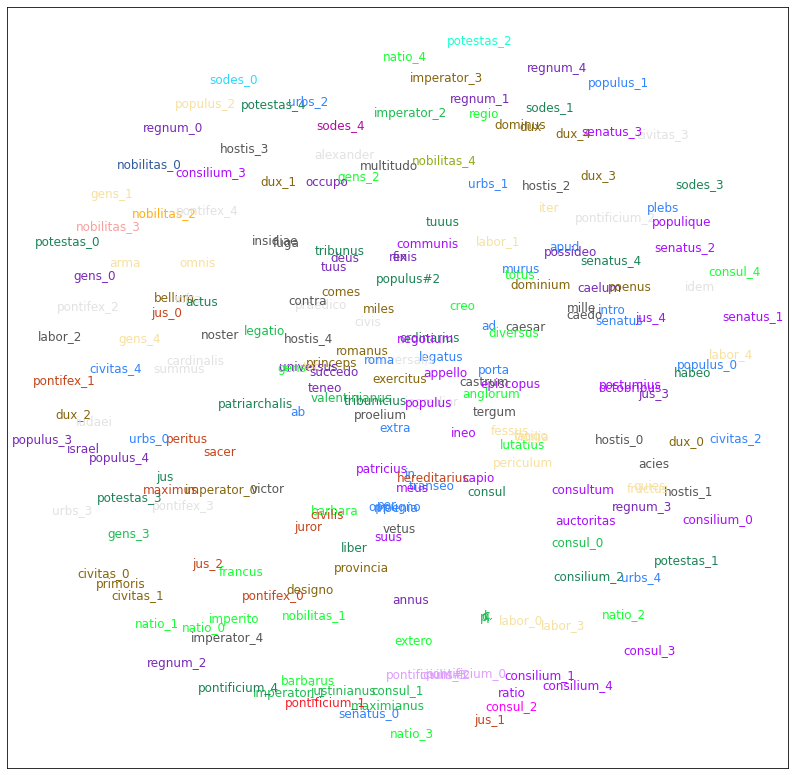

In [79]:
pos = nx.spring_layout(G,k=0.01)
plt.figure(1,figsize=(14,14))

for node in G.nodes:    
    lbl = node
    #lbl = node.split('_')[0]
    col = communities_dict[lbl]
    nx.draw_networkx_labels(G, pos=pos, labels={node:node}, font_color=col)

nx.draw_networkx_nodes(G, pos,
                       node_size=0,
                       label=[ n for n in G.nodes ],
                       node_color = communities_dict.values())

In [80]:
# interactive, but slooow!
def plot_pyvis_graph():    
    g_ = network.Network(notebook=True, width="100%")
    g_.from_nx(g)
    g_.show_buttons()

    for node in g_.nodes:
        if node["label"] in color_discrete_map_terms.keys():
            node["color"] = color_discrete_map_terms[node["label"]]

    g_.show('collocs.html')
# uncomment to plotTODOTODO
# plot_pyvis_graph()